## Требования по проекту:
##### 1. Сформулировать задачу DS и выбрать метрики.
##### 2. Провести исследование, чем периоды атака/нормальный отличаются? Есть ли зависимости?
##### 3. Построить модель (на ваш выбор) для предсказания состояния.

Тестовый стенд SWaT, разработанный iTrust Labs в Сингапурском университете технологий и дизайна (SUTD), представляет собой высокоточный тестовый стенд ICS, имитирующий работу современного водоочистного сооружения. Сконструированный в 2015 году при поддержке Министерства обороны (MINDEF) Сингапура, этот стенд предназначен для создания реалистичной среды для изучения угроз киберфизической безопасности в средах ICS. Тестовая среда SWaT широко используется в академических и промышленных исследованиях, особенно в области обнаружения аномалий и других решений в сфере кибербезопасности.

Набор данных, используемый в этом исследовании, — набор данных от iTrust — получен из тестовой среды SWaT.

Этот набор данных состоит из двух основных потоков данных:

1. Данные о сетевом трафике: фиксируют связь между программируемыми логическими контроллерами и другими устройствами, включая сетевые журналы, сведения о пакетах и протоколы связи;
2. Данные о процессе: включают показания датчиков и состояние исполнительных механизмов на различных этапах процесса очистки воды. Эти данные имеют решающее значение для мониторинга физического состояния системы.

Набор данных включает в себя данные о нормальной работе, а также данные, собранные во время серии поэтапных кибератак, нацеленных как на сетевые, так и на физические уровни системы. Атаки включают в себя различные формы сетевых вторжений, подмену датчиков и манипуляции с исполнительными механизмами, имитирующие реальные киберфизические угрозы. В связи с чем искажения показателей датчиков при наступлении атак может быть проанализировано с целью обнаружения отдельной инцормации как от конкретных узлов, так и комплекса компонентов во взаимосвязи друг с другом, что может стать задачей для бинарной классификации состояний с атаками(1) и без них(0).

## 1. Импорт библиотек проекта

In [1]:
# импортируем необходимые для исследования библиотеки
import shap
import warnings
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import lightgbm as lgbm
import plotly.express as px
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler
from sklearn.tree import DecisionTreeClassifier 
from sklearn.ensemble import RandomForestClassifier 
from sklearn.linear_model import LogisticRegression
from sklearn.dummy import DummyClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve
from matplotlib import pyplot
from sklearn.utils import shuffle
from pandas.plotting import scatter_matrix
from sklearn.model_selection import cross_validate
from sklearn.model_selection import cross_val_score
from imblearn.under_sampling import RandomUnderSampler
import matplotlib.dates as mdates
from sklearn.pipeline import Pipeline

# убираем незначительные предупреждения
warnings.filterwarnings('ignore')
# убираем лимиты на максимальное количество отображаемых данных
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

## 2. Анализ предметной области и предобработка данных

На полигоне SWaT сотрудники и партнеры iTrust исследуют возможные векторы атак на промышленные объекты и разрабатывают подтвержденные практикой рекомендации по защите объектов критически важных инфраструктур.

Полигон SWaT является уменьшенной копией полноценного водоочистительного предприятия. На полигоне используется современный процесс очистки воды, состоящий из шести этапов:
- P1: забор сырой воды
- P2: обеззараживание химикатами
- P3: ультрафильтрация
- P4: дехлорирование с помощью ультрафиолетовых ламп
- P5: очистка методом обратного осмоса
- P6: обратная промывка и очистка мембраны ультрафильтрации

В состав полигона SWaT входят водоочистительное оборудование, несколько уровней сетей связи, многочисленные ПЛК, SCADA, АРМ оператора и хранилище истории данных предприятия.

Признаки являются соответствием этапов очистки воды и показателям датчиков реагирования на данных этапах:
- 't_stamp' - временной признак(может послужить исходным признаком для формирования дополнительных фичей для модели, например, дни недели, день\ночь и т.п.);
- 'FIT101', 'LIT101', 'MV101', 'P101', 'P102' - предположительно, этап забора воды;
- 'AIT201','AIT202', 'AIT203', 'FIT201', 'MV201', 'P201', 'P202', 'P203','P204', 'P205', 'P206' - предположительно, этап обеззараживания химикатами;
- 'DPIT301', 'FIT301', 'LIT301', 'MV301','MV302', 'MV303', 'MV304', 'P301', 'P302' - предположительно, ультрафильтрация;
- 'AIT401', 'AIT402', 'FIT401', 'LIT401', 'P401', 'P402', 'P403', 'P404', 'UV401' - предположительно, дехлорирование с помощью ультрафиолетовых ламп;
- 'AIT501','AIT502', 'AIT503', 'AIT504', 'FIT501', 'FIT502', 'FIT503', 'FIT504','P501', 'P502', 'PIT501', 'PIT502', 'PIT503' - предположительно, очистка методом обратного осмоса;
- 'FIT601', 'P601', 'P602','P603' - предположительно, обратная промывка и очистка мембраны ультрафильтрации;
- 'State' - состояние, наличие/отсутствие атаки, целевой признак для предугадывания моделью.

**Блок-схема физического процесса SWaT**
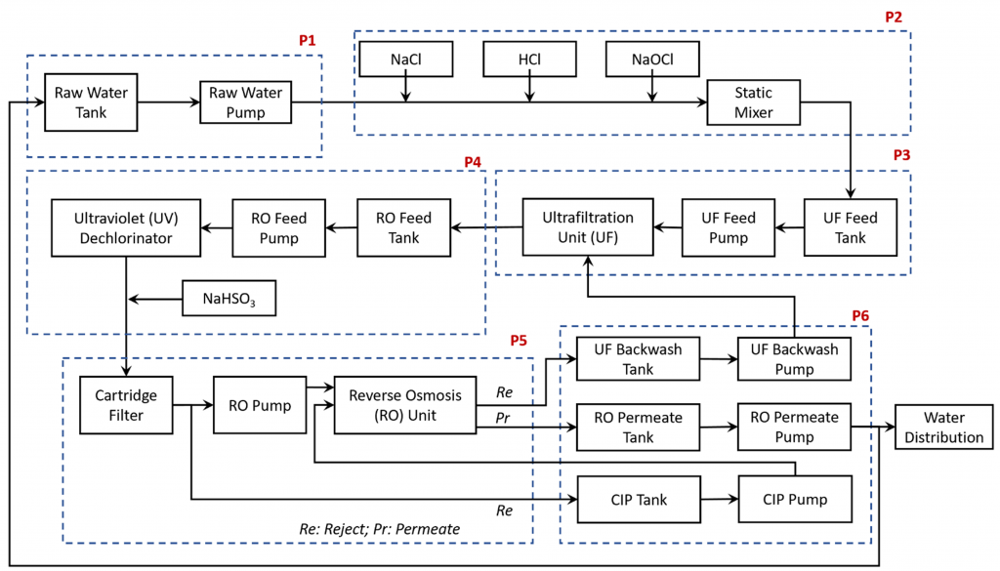

Данные были получены из источника https://www.kaggle.com/datasets/abdullahk1h2a3n/swatdataset

In [2]:
%%time
# чтение данных датасета
data = pd.read_csv('D:/SWaT/SWaT_Dataset_Attack_v0.csv', sep=';', decimal=',')
data.sort_index(inplace=False)

CPU times: total: 2.2 s
Wall time: 2.25 s


In [3]:
# предварительный просмотр данных
display(data.head(5))
display(data.tail(5))

,Timestamp,FIT101,LIT101,MV101,P101,P102,AIT201,AIT202,AIT203,FIT201,MV201,P201,P202,P203,P204,P205,P206,DPIT301,FIT301,LIT301,MV301,MV302,MV303,MV304,P301,P302,AIT401,AIT402,FIT401,LIT401,P401,P402,P403,P404,UV401,AIT501,AIT502,AIT503,AIT504,FIT501,FIT502,FIT503,FIT504,P501,P502,PIT501,PIT502,PIT503,FIT601,P601,P602,P603,Normal/Attack
0,28/12/2015 10:00:00 AM,2.427057,522.8467,2,2,1,262.0161,8.396437,328.6337,2.445391,2,1,1,2,1,2,1,19.74838,2.206835,956.1651,1,2,1,1,1,2,148.808,156.0882,1.713517,942.0662,1,2,1,1,2,7.878621,145.1166,264.5475,12.03538,1.723789,1.279621,0.735269,0.307786,2,1,250.8652,1.649953,189.5988,0.000128,1,1,1,Normal
1,28/12/2015 10:00:01 AM,2.446274,522.8860,2,2,1,262.0161,8.396437,328.6337,2.445391,2,1,1,2,1,2,1,19.74838,2.208244,956.1651,1,2,1,1,1,2,148.808,156.0882,1.715952,942.0277,1,2,1,1,2,7.878621,145.1166,264.5475,12.03538,1.723789,1.297554,0.735269,0.307786,2,1,250.8652,1.649953,189.6789,0.000128,1,1,1,Normal
2,28/12/2015 10:00:02 AM,2.489191,522.8467,2,2,1,262.0161,8.394514,328.6337,2.442316,2,1,1,2,1,2,1,19.69076,2.208628,956.4855,1,2,1,1,1,2,148.808,156.0882,1.715952,941.8739,1,2,1,1,2,7.878621,145.1166,264.5475,12.03538,1.723404,1.293967,0.735269,0.308619,2,1,250.8812,1.649953,189.6789,0.000128,1,1,1,Normal
3,28/12/2015 10:00:03 AM,2.534350,522.9645,2,2,1,262.0161,8.394514,328.6337,2.442316,2,1,1,2,1,2,1,19.69076,2.208628,956.8060,1,2,1,1,1,2,148.808,156.0882,1.714670,941.7970,1,2,1,1,2,7.878621,145.0141,264.5475,12.03538,1.723404,1.281158,0.735269,0.308619,2,1,250.8812,1.649953,189.6148,0.000128,1,1,1,Normal
4,28/12/2015 10:00:04 AM,2.569260,523.4748,2,2,1,262.0161,8.394514,328.6337,2.443085,2,1,1,2,1,2,1,19.69076,2.208628,957.0864,1,2,1,1,1,2,148.808,156.0882,1.714670,942.2200,1,2,1,1,2,7.878621,144.8859,264.5475,12.03538,1.723404,1.281158,0.735269,0.308619,2,1,250.8812,1.649953,189.5027,0.000128,1,1,1,Normal


,Timestamp,FIT101,LIT101,MV101,P101,P102,AIT201,AIT202,AIT203,FIT201,MV201,P201,P202,P203,P204,P205,P206,DPIT301,FIT301,LIT301,MV301,MV302,MV303,MV304,P301,P302,AIT401,AIT402,FIT401,LIT401,P401,P402,P403,P404,UV401,AIT501,AIT502,AIT503,AIT504,FIT501,FIT502,FIT503,FIT504,P501,P502,PIT501,PIT502,PIT503,FIT601,P601,P602,P603,Normal/Attack
449914,2/1/2016 2:59:55 PM,2.559972,519.5495,2,2,1,168.0979,8.638683,301.9226,2.459488,2,2,1,2,1,2,1,20.39823,2.196586,974.5498,1,2,1,1,1,2,148.8032,145.6037,1.705315,956.8701,1,2,1,1,2,7.745642,139.1182,257.1136,14.8039,1.716483,1.288971,0.734885,0.306569,2,1,251.1535,0.865024,189.0220,0.0,1,1,1,Normal
449915,2/1/2016 2:59:56 PM,2.549082,520.4131,2,2,1,168.0979,8.638683,301.9226,2.459488,2,2,1,2,1,2,1,20.39823,2.196586,974.5898,1,2,1,1,1,2,148.8032,145.6037,1.705315,957.1777,1,2,1,1,2,7.745642,139.1182,257.1136,14.8039,1.714560,1.272704,0.734885,0.306569,2,1,251.0734,0.865024,188.9259,0.0,1,1,1,Normal
449916,2/1/2016 2:59:57 PM,2.531467,520.6878,2,2,1,168.0979,8.638683,301.9226,2.460129,2,2,1,2,1,2,1,20.33101,2.195561,974.2695,1,2,1,1,1,2,148.8032,145.5524,1.706212,957.2930,1,2,1,1,2,7.745642,139.1182,257.1136,14.8039,1.714560,1.269502,0.734885,0.306569,2,1,251.0734,0.865024,188.9259,0.0,1,1,1,Normal
449917,2/1/2016 2:59:58 PM,2.521218,520.7271,2,2,1,168.0979,8.638683,301.9226,2.460129,2,2,1,2,1,2,1,20.29579,2.195561,974.2294,1,2,1,1,1,2,148.8032,145.5524,1.706212,957.6775,1,2,1,1,2,7.745642,139.1182,257.1136,14.8039,1.714560,1.263866,0.734885,0.307978,2,1,251.0734,0.865024,188.9259,0.0,1,1,1,Normal
449918,2/1/2016 2:59:59 PM,2.501681,521.1196,2,2,1,168.0979,8.638683,301.9226,2.458206,2,2,1,2,1,2,1,20.28619,2.198379,974.4296,1,2,1,1,1,2,148.8032,145.5524,1.705315,957.7544,1,2,1,1,2,7.745642,139.1182,257.1136,14.8039,1.714560,1.272704,0.734885,0.308298,2,1,251.0734,0.865024,188.9259,0.0,1,1,1,Normal


In [4]:
# получение сводной информации о столбцах
display(data.columns)

Index(['Timestamp', 'FIT101', 'LIT101', 'MV101', 'P101', 'P102', 'AIT201',
       'AIT202', 'AIT203', 'FIT201', 'MV201', 'P201', 'P202', 'P203', 'P204',
       'P205', 'P206', 'DPIT301', 'FIT301', 'LIT301', 'MV301', 'MV302',
       'MV303', 'MV304', 'P301', 'P302', 'AIT401', 'AIT402', 'FIT401',
       'LIT401', 'P401', 'P402', 'P403', 'P404', 'UV401', 'AIT501', 'AIT502',
       'AIT503', 'AIT504', 'FIT501', 'FIT502', 'FIT503', 'FIT504', 'P501',
       'P502', 'PIT501', 'PIT502', 'PIT503', 'FIT601', 'P601', 'P602', 'P603',
       'Normal/Attack'],
      dtype='object')

In [5]:
# переименовываем столбцы в более удобном стиле
data.columns = ['time_stamp', 'fit_101', 'lit_101', 'mv_101', 'p_101', 'p_102', 'ait_201',
       'ait_202', 'ait_203', 'fit_201', 'mv_201', 'p_201', 'p_202', 'p_203',
       'p_204', 'p_205', 'p_206', 'dpit_301', 'fit_301', 'lit_301', 'mv_301',
       'mv_302', 'mv_303', 'mv_304', 'p_301', 'p_302', 'ait_401', 'ait_402',
       'fit_401', 'lit_401', 'p_401', 'p_402', 'p_403', 'p_404', 'uv_401', 'ait_501',
       'ait_502', 'ait_503', 'ait_504', 'fit_501', 'fit_502', 'fit_503', 'fit_504',
       'p_501', 'p_502', 'pit_501', 'pit_502', 'pit_503', 'fit_601', 'p_601', 'p_602',
       'p_603', 'state']
display(data.columns)

Index(['time_stamp', 'fit_101', 'lit_101', 'mv_101', 'p_101', 'p_102',
       'ait_201', 'ait_202', 'ait_203', 'fit_201', 'mv_201', 'p_201', 'p_202',
       'p_203', 'p_204', 'p_205', 'p_206', 'dpit_301', 'fit_301', 'lit_301',
       'mv_301', 'mv_302', 'mv_303', 'mv_304', 'p_301', 'p_302', 'ait_401',
       'ait_402', 'fit_401', 'lit_401', 'p_401', 'p_402', 'p_403', 'p_404',
       'uv_401', 'ait_501', 'ait_502', 'ait_503', 'ait_504', 'fit_501',
       'fit_502', 'fit_503', 'fit_504', 'p_501', 'p_502', 'pit_501', 'pit_502',
       'pit_503', 'fit_601', 'p_601', 'p_602', 'p_603', 'state'],
      dtype='object')

In [6]:
# выведем общую информацию о датасете
display(data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 449919 entries, 0 to 449918
Data columns (total 53 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   time_stamp  449919 non-null  object 
 1   fit_101     449919 non-null  float64
 2   lit_101     449919 non-null  float64
 3   mv_101      449919 non-null  int64  
 4   p_101       449919 non-null  int64  
 5   p_102       449919 non-null  int64  
 6   ait_201     449919 non-null  float64
 7   ait_202     449919 non-null  float64
 8   ait_203     449919 non-null  float64
 9   fit_201     449919 non-null  float64
 10  mv_201      449919 non-null  int64  
 11  p_201       449919 non-null  int64  
 12  p_202       449919 non-null  int64  
 13  p_203       449919 non-null  int64  
 14  p_204       449919 non-null  int64  
 15  p_205       449919 non-null  int64  
 16  p_206       449919 non-null  int64  
 17  dpit_301    449919 non-null  float64
 18  fit_301     449919 non-null  float64
 19  li

None

In [7]:
# обзор данных
display(data.describe())

,fit_101,lit_101,mv_101,p_101,p_102,ait_201,ait_202,ait_203,fit_201,mv_201,p_201,p_202,p_203,p_204,p_205,p_206,dpit_301,fit_301,lit_301,mv_301,mv_302,mv_303,mv_304,p_301,p_302,ait_401,ait_402,fit_401,lit_401,p_401,p_402,p_403,p_404,uv_401,ait_501,ait_502,ait_503,ait_504,fit_501,fit_502,fit_503,fit_504,p_501,p_502,pit_501,pit_502,pit_503,fit_601,p_601,p_602,p_603
count,449919.000000,449919.000000,449919.000000,449919.000000,449919.000000,449919.000000,449919.000000,449919.000000,449919.000000,449919.000000,449919.000000,449919.0,449919.000000,449919.000000,449919.000000,449919.000000,449919.000000,449919.000000,449919.000000,449919.000000,449919.000000,449919.000000,449919.000000,449919.0,449919.000000,449919.000000,449919.000000,449919.000000,449919.000000,449919.0,449919.000000,449919.000000,449919.0,449919.000000,449919.000000,449919.000000,449919.000000,449919.000000,449919.000000,449919.000000,449919.000000,449919.000000,449919.000000,449919.0,449919.000000,449919.000000,449919.000000,449919.000000,449919.0,449919.000000,449919.0
mean,1.714346,607.019967,1.665335,1.693251,1.006946,210.297302,8.528535,320.301478,1.702908,1.691584,1.121068,1.0,1.690689,1.000124,1.691131,1.000122,15.827634,1.713555,910.076801,1.007321,1.749655,1.023349,1.101163,1.0,1.772946,148.805855,161.990135,1.590214,833.542913,1.0,1.928792,1.000133,1.0,1.925849,7.787358,147.509939,264.789668,14.504030,1.603014,1.195462,0.679549,0.283806,1.925862,1.0,232.173817,1.013408,174.714484,0.016566,1.0,1.009099,1.0
std,1.191716,125.303003,0.482323,0.461145,0.083051,35.157909,0.114844,16.631029,1.130277,0.470611,0.326207,0.0,0.462210,0.011156,0.462027,0.011056,7.740243,0.907519,80.522063,0.122666,0.448330,0.181441,0.324082,0.0,0.418928,0.003889,44.740211,0.449035,186.068540,0.0,0.257173,0.011547,0.0,0.262017,0.084308,21.429151,6.542092,7.944618,0.444681,0.331968,0.189503,0.080924,0.261995,0.0,61.750930,0.412723,47.479809,0.159603,0.0,0.094956,0.0
min,0.000000,189.826300,0.000000,1.000000,1.000000,168.033800,6.000000,285.337100,0.000000,0.000000,1.000000,1.0,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,364.386300,0.000000,0.000000,0.000000,0.000000,1.0,1.000000,148.759900,140.835700,0.000000,243.014600,1.0,1.000000,1.000000,1.0,1.000000,7.432902,129.838500,244.873100,9.536016,0.000000,0.000000,0.000000,0.000000,1.000000,1.0,9.468726,0.000000,3.140220,0.000000,1.0,1.000000,1.0
25%,0.000000,510.011100,1.000000,1.000000,1.000000,177.102000,8.441618,306.383000,0.000000,1.000000,1.000000,1.0,1.000000,1.000000,1.000000,1.000000,19.316220,2.194664,836.444200,1.000000,2.000000,1.000000,1.000000,1.0,2.000000,148.803200,146.116400,1.710441,819.097700,1.0,2.000000,1.000000,1.0,2.000000,7.772879,138.990000,259.965400,13.035120,1.719559,1.272576,0.730660,0.306249,2.000000,1.0,248.029400,0.816967,186.698900,0.000000,1.0,1.000000,1.0
50%,2.477020,530.422500,2.000000,2.000000,1.000000,193.508100,8.551525,321.661100,2.446673,2.000000,1.000000,1.0,2.000000,1.000000,2.000000,1.000000,19.898840,2.201582,924.682800,1.000000,2.000000,1.000000,1.000000,1.0,2.000000,148.808000,150.166600,1.717361,884.427100,1.0,2.000000,1.000000,1.0,2.000000,7.797873,142.912100,264.387300,14.611640,1.726993,1.286410,0.732708,0.306633,2.000000,1.0,249.295100,0.961138,187.724300,0.000000,1.0,1.000000,1.0
75%,2.577907,727.432100,2.000000,2.000000,1.000000,253.845200,8.610806,331.684200,2.454362,2.000000,1.000000,1.0,2.000000,1.000000,2.000000,1.000000,20.116530,2.207091,977.794200,1.000000,2.000000,1.000000,1.000000,1.0,2.000000,148.808000,153.652900,1.724153,937.375100,1.0,2.000000,1.000000,1.0,2.000000,7.840810,144.706500,269.129700,15.419120,1.733145,1.300115,0.734885,0.308106,2.000000,1.0,250.881200,1.409669,189.118200,0.000128,1.0,1.000000,1.0
max,2.760145,925.032300,2.000000,2.000000,2.000000,267.719800,8.733210,384.465500,2.826899,2.000000,2.000000,1.0,2.000000,2.000000,2.000000,2.000000,45.000000,2.376197,1201.000000,2.000000,2.000000,2.000000,2.000000,1.0,2.000000,148.856100,333.811800,1.744

In [8]:
# удаляем дублирующие строки
display(data.duplicated().sum())
display(data.duplicated().head(5))

0

0    False
1    False
2    False
3    False
4    False
dtype: bool

In [9]:
# ищем пустые строки
display(data.isna().sum())
display(data.isnull().sum())

time_stamp    0
fit_101       0
lit_101       0
mv_101        0
p_101         0
p_102         0
ait_201       0
ait_202       0
ait_203       0
fit_201       0
mv_201        0
p_201         0
p_202         0
p_203         0
p_204         0
p_205         0
p_206         0
dpit_301      0
fit_301       0
lit_301       0
mv_301        0
mv_302        0
mv_303        0
mv_304        0
p_301         0
p_302         0
ait_401       0
ait_402       0
fit_401       0
lit_401       0
p_401         0
p_402         0
p_403         0
p_404         0
uv_401        0
ait_501       0
ait_502       0
ait_503       0
ait_504       0
fit_501       0
fit_502       0
fit_503       0
fit_504       0
p_501         0
p_502         0
pit_501       0
pit_502       0
pit_503       0
fit_601       0
p_601         0
p_602         0
p_603         0
state         0
dtype: int64

time_stamp    0
fit_101       0
lit_101       0
mv_101        0
p_101         0
p_102         0
ait_201       0
ait_202       0
ait_203       0
fit_201       0
mv_201        0
p_201         0
p_202         0
p_203         0
p_204         0
p_205         0
p_206         0
dpit_301      0
fit_301       0
lit_301       0
mv_301        0
mv_302        0
mv_303        0
mv_304        0
p_301         0
p_302         0
ait_401       0
ait_402       0
fit_401       0
lit_401       0
p_401         0
p_402         0
p_403         0
p_404         0
uv_401        0
ait_501       0
ait_502       0
ait_503       0
ait_504       0
fit_501       0
fit_502       0
fit_503       0
fit_504       0
p_501         0
p_502         0
pit_501       0
pit_502       0
pit_503       0
fit_601       0
p_601         0
p_602         0
p_603         0
state         0
dtype: int64

In [10]:
# приведем типы данных к единым типам данных
data['time_stamp'] = data['time_stamp'].astype('datetime64[ns]')
# визуально проверим корректность приведенных данных
display(data.head(5))
display(data.tail(5))

,time_stamp,fit_101,lit_101,mv_101,p_101,p_102,ait_201,ait_202,ait_203,fit_201,mv_201,p_201,p_202,p_203,p_204,p_205,p_206,dpit_301,fit_301,lit_301,mv_301,mv_302,mv_303,mv_304,p_301,p_302,ait_401,ait_402,fit_401,lit_401,p_401,p_402,p_403,p_404,uv_401,ait_501,ait_502,ait_503,ait_504,fit_501,fit_502,fit_503,fit_504,p_501,p_502,pit_501,pit_502,pit_503,fit_601,p_601,p_602,p_603,state
0,2015-12-28 10:00:00,2.427057,522.8467,2,2,1,262.0161,8.396437,328.6337,2.445391,2,1,1,2,1,2,1,19.74838,2.206835,956.1651,1,2,1,1,1,2,148.808,156.0882,1.713517,942.0662,1,2,1,1,2,7.878621,145.1166,264.5475,12.03538,1.723789,1.279621,0.735269,0.307786,2,1,250.8652,1.649953,189.5988,0.000128,1,1,1,Normal
1,2015-12-28 10:00:01,2.446274,522.8860,2,2,1,262.0161,8.396437,328.6337,2.445391,2,1,1,2,1,2,1,19.74838,2.208244,956.1651,1,2,1,1,1,2,148.808,156.0882,1.715952,942.0277,1,2,1,1,2,7.878621,145.1166,264.5475,12.03538,1.723789,1.297554,0.735269,0.307786,2,1,250.8652,1.649953,189.6789,0.000128,1,1,1,Normal
2,2015-12-28 10:00:02,2.489191,522.8467,2,2,1,262.0161,8.394514,328.6337,2.442316,2,1,1,2,1,2,1,19.69076,2.208628,956.4855,1,2,1,1,1,2,148.808,156.0882,1.715952,941.8739,1,2,1,1,2,7.878621,145.1166,264.5475,12.03538,1.723404,1.293967,0.735269,0.308619,2,1,250.8812,1.649953,189.6789,0.000128,1,1,1,Normal
3,2015-12-28 10:00:03,2.534350,522.9645,2,2,1,262.0161,8.394514,328.6337,2.442316,2,1,1,2,1,2,1,19.69076,2.208628,956.8060,1,2,1,1,1,2,148.808,156.0882,1.714670,941.7970,1,2,1,1,2,7.878621,145.0141,264.5475,12.03538,1.723404,1.281158,0.735269,0.308619,2,1,250.8812,1.649953,189.6148,0.000128,1,1,1,Normal
4,2015-12-28 10:00:04,2.569260,523.4748,2,2,1,262.0161,8.394514,328.6337,2.443085,2,1,1,2,1,2,1,19.69076,2.208628,957.0864,1,2,1,1,1,2,148.808,156.0882,1.714670,942.2200,1,2,1,1,2,7.878621,144.8859,264.5475,12.03538,1.723404,1.281158,0.735269,0.308619,2,1,250.8812,1.649953,189.5027,0.000128,1,1,1,Normal


,time_stamp,fit_101,lit_101,mv_101,p_101,p_102,ait_201,ait_202,ait_203,fit_201,mv_201,p_201,p_202,p_203,p_204,p_205,p_206,dpit_301,fit_301,lit_301,mv_301,mv_302,mv_303,mv_304,p_301,p_302,ait_401,ait_402,fit_401,lit_401,p_401,p_402,p_403,p_404,uv_401,ait_501,ait_502,ait_503,ait_504,fit_501,fit_502,fit_503,fit_504,p_501,p_502,pit_501,pit_502,pit_503,fit_601,p_601,p_602,p_603,state
449914,2016-02-01 14:59:55,2.559972,519.5495,2,2,1,168.0979,8.638683,301.9226,2.459488,2,2,1,2,1,2,1,20.39823,2.196586,974.5498,1,2,1,1,1,2,148.8032,145.6037,1.705315,956.8701,1,2,1,1,2,7.745642,139.1182,257.1136,14.8039,1.716483,1.288971,0.734885,0.306569,2,1,251.1535,0.865024,189.0220,0.0,1,1,1,Normal
449915,2016-02-01 14:59:56,2.549082,520.4131,2,2,1,168.0979,8.638683,301.9226,2.459488,2,2,1,2,1,2,1,20.39823,2.196586,974.5898,1,2,1,1,1,2,148.8032,145.6037,1.705315,957.1777,1,2,1,1,2,7.745642,139.1182,257.1136,14.8039,1.714560,1.272704,0.734885,0.306569,2,1,251.0734,0.865024,188.9259,0.0,1,1,1,Normal
449916,2016-02-01 14:59:57,2.531467,520.6878,2,2,1,168.0979,8.638683,301.9226,2.460129,2,2,1,2,1,2,1,20.33101,2.195561,974.2695,1,2,1,1,1,2,148.8032,145.5524,1.706212,957.2930,1,2,1,1,2,7.745642,139.1182,257.1136,14.8039,1.714560,1.269502,0.734885,0.306569,2,1,251.0734,0.865024,188.9259,0.0,1,1,1,Normal
449917,2016-02-01 14:59:58,2.521218,520.7271,2,2,1,168.0979,8.638683,301.9226,2.460129,2,2,1,2,1,2,1,20.29579,2.195561,974.2294,1,2,1,1,1,2,148.8032,145.5524,1.706212,957.6775,1,2,1,1,2,7.745642,139.1182,257.1136,14.8039,1.714560,1.263866,0.734885,0.307978,2,1,251.0734,0.865024,188.9259,0.0,1,1,1,Normal
449918,2016-02-01 14:59:59,2.501681,521.1196,2,2,1,168.0979,8.638683,301.9226,2.458206,2,2,1,2,1,2,1,20.28619,2.198379,974.4296,1,2,1,1,1,2,148.8032,145.5524,1.705315,957.7544,1,2,1,1,2,7.745642,139.1182,257.1136,14.8039,1.714560,1.272704,0.734885,0.308298,2,1,251.0734,0.865024,188.9259,0.0,1,1,1,Normal


In [11]:
# в выборке есть, предположительно, категорийные данные/признаки, проверим их: MV101, P101, P102, MV201, P201, P202, P203, P204, P205, P206, 
# MV301, MV302, MV303, MV304, P301, P302, P401, P402, P403, P404, UV401, P501, P502, P601, P602, P603
display(data['mv_101'].value_counts())
display(data['p_101'].value_counts())
display(data['p_102'].value_counts())

display(data['mv_201'].value_counts())
display(data['p_201'].value_counts())
display(data['p_202'].value_counts())
display(data['p_203'].value_counts())
display(data['p_204'].value_counts())
display(data['p_205'].value_counts())
display(data['p_206'].value_counts())

display(data['mv_301'].value_counts())
display(data['mv_302'].value_counts())
display(data['mv_303'].value_counts())
display(data['mv_304'].value_counts())
display(data['p_301'].value_counts())
display(data['p_302'].value_counts())

display(data['p_401'].value_counts())
display(data['p_402'].value_counts())
display(data['p_403'].value_counts())
display(data['p_404'].value_counts())
display(data['uv_401'].value_counts())

display(data['p_501'].value_counts())
display(data['p_502'].value_counts())

display(data['p_601'].value_counts())
display(data['p_602'].value_counts())
display(data['p_603'].value_counts())

mv_101
2    301590
1    146086
0      2243
Name: count, dtype: int64

p_101
2    311907
1    138012
Name: count, dtype: int64

p_102
1    446794
2      3125
Name: count, dtype: int64

mv_201
2    312997
1    135082
0      1840
Name: count, dtype: int64

p_201
1    395448
2     54471
Name: count, dtype: int64

p_202
1    449919
Name: count, dtype: int64

p_203
2    310754
1    139165
Name: count, dtype: int64

p_204
1    449863
2        56
Name: count, dtype: int64

p_205
2    310953
1    138966
Name: count, dtype: int64

p_206
1    449864
2        55
Name: count, dtype: int64

mv_301
1    443125
2      5044
0      1750
Name: count, dtype: int64

mv_302
2    340282
1    106639
0      2998
Name: count, dtype: int64

mv_303
1    434862
2     12781
0      2276
Name: count, dtype: int64

mv_304
1    398060
2     48687
0      3172
Name: count, dtype: int64

p_301
1    449919
Name: count, dtype: int64

p_302
2    347763
1    102156
Name: count, dtype: int64

p_401
1    449919
Name: count, dtype: int64

p_402
2    417881
1     32038
Name: count, dtype: int64

p_403
1    449859
2        60
Name: count, dtype: int64

p_404
1    449919
Name: count, dtype: int64

uv_401
2    416557
1     33362
Name: count, dtype: int64

p_501
2    416563
1     33356
Name: count, dtype: int64

p_502
1    449919
Name: count, dtype: int64

p_601
1    449919
Name: count, dtype: int64

p_602
1    445825
2      4094
Name: count, dtype: int64

p_603
1    449919
Name: count, dtype: int64

Из проверки выше следует, что можно убрать следующие фичи с одной категорией(т.к. изменений в динамике нет и нет влияния на результаты): p_202, p_301, p_401, p_404, p_502, p_601, p_603.

In [12]:
# удалим лишние фичи
data_clean = data.drop(['p_202', 'p_301', 'p_401', 'p_404', 'p_502', 'p_601', 'p_603'], axis=1)
display(data_clean.head(5))
display(data_clean.tail(5))

,time_stamp,fit_101,lit_101,mv_101,p_101,p_102,ait_201,ait_202,ait_203,fit_201,mv_201,p_201,p_203,p_204,p_205,p_206,dpit_301,fit_301,lit_301,mv_301,mv_302,mv_303,mv_304,p_302,ait_401,ait_402,fit_401,lit_401,p_402,p_403,uv_401,ait_501,ait_502,ait_503,ait_504,fit_501,fit_502,fit_503,fit_504,p_501,pit_501,pit_502,pit_503,fit_601,p_602,state
0,2015-12-28 10:00:00,2.427057,522.8467,2,2,1,262.0161,8.396437,328.6337,2.445391,2,1,2,1,2,1,19.74838,2.206835,956.1651,1,2,1,1,2,148.808,156.0882,1.713517,942.0662,2,1,2,7.878621,145.1166,264.5475,12.03538,1.723789,1.279621,0.735269,0.307786,2,250.8652,1.649953,189.5988,0.000128,1,Normal
1,2015-12-28 10:00:01,2.446274,522.8860,2,2,1,262.0161,8.396437,328.6337,2.445391,2,1,2,1,2,1,19.74838,2.208244,956.1651,1,2,1,1,2,148.808,156.0882,1.715952,942.0277,2,1,2,7.878621,145.1166,264.5475,12.03538,1.723789,1.297554,0.735269,0.307786,2,250.8652,1.649953,189.6789,0.000128,1,Normal
2,2015-12-28 10:00:02,2.489191,522.8467,2,2,1,262.0161,8.394514,328.6337,2.442316,2,1,2,1,2,1,19.69076,2.208628,956.4855,1,2,1,1,2,148.808,156.0882,1.715952,941.8739,2,1,2,7.878621,145.1166,264.5475,12.03538,1.723404,1.293967,0.735269,0.308619,2,250.8812,1.649953,189.6789,0.000128,1,Normal
3,2015-12-28 10:00:03,2.534350,522.9645,2,2,1,262.0161,8.394514,328.6337,2.442316,2,1,2,1,2,1,19.69076,2.208628,956.8060,1,2,1,1,2,148.808,156.0882,1.714670,941.7970,2,1,2,7.878621,145.0141,264.5475,12.03538,1.723404,1.281158,0.735269,0.308619,2,250.8812,1.649953,189.6148,0.000128,1,Normal
4,2015-12-28 10:00:04,2.569260,523.4748,2,2,1,262.0161,8.394514,328.6337,2.443085,2,1,2,1,2,1,19.69076,2.208628,957.0864,1,2,1,1,2,148.808,156.0882,1.714670,942.2200,2,1,2,7.878621,144.8859,264.5475,12.03538,1.723404,1.281158,0.735269,0.308619,2,250.8812,1.649953,189.5027,0.000128,1,Normal


,time_stamp,fit_101,lit_101,mv_101,p_101,p_102,ait_201,ait_202,ait_203,fit_201,mv_201,p_201,p_203,p_204,p_205,p_206,dpit_301,fit_301,lit_301,mv_301,mv_302,mv_303,mv_304,p_302,ait_401,ait_402,fit_401,lit_401,p_402,p_403,uv_401,ait_501,ait_502,ait_503,ait_504,fit_501,fit_502,fit_503,fit_504,p_501,pit_501,pit_502,pit_503,fit_601,p_602,state
449914,2016-02-01 14:59:55,2.559972,519.5495,2,2,1,168.0979,8.638683,301.9226,2.459488,2,2,2,1,2,1,20.39823,2.196586,974.5498,1,2,1,1,2,148.8032,145.6037,1.705315,956.8701,2,1,2,7.745642,139.1182,257.1136,14.8039,1.716483,1.288971,0.734885,0.306569,2,251.1535,0.865024,189.0220,0.0,1,Normal
449915,2016-02-01 14:59:56,2.549082,520.4131,2,2,1,168.0979,8.638683,301.9226,2.459488,2,2,2,1,2,1,20.39823,2.196586,974.5898,1,2,1,1,2,148.8032,145.6037,1.705315,957.1777,2,1,2,7.745642,139.1182,257.1136,14.8039,1.714560,1.272704,0.734885,0.306569,2,251.0734,0.865024,188.9259,0.0,1,Normal
449916,2016-02-01 14:59:57,2.531467,520.6878,2,2,1,168.0979,8.638683,301.9226,2.460129,2,2,2,1,2,1,20.33101,2.195561,974.2695,1,2,1,1,2,148.8032,145.5524,1.706212,957.2930,2,1,2,7.745642,139.1182,257.1136,14.8039,1.714560,1.269502,0.734885,0.306569,2,251.0734,0.865024,188.9259,0.0,1,Normal
449917,2016-02-01 14:59:58,2.521218,520.7271,2,2,1,168.0979,8.638683,301.9226,2.460129,2,2,2,1,2,1,20.29579,2.195561,974.2294,1,2,1,1,2,148.8032,145.5524,1.706212,957.6775,2,1,2,7.745642,139.1182,257.1136,14.8039,1.714560,1.263866,0.734885,0.307978,2,251.0734,0.865024,188.9259,0.0,1,Normal
449918,2016-02-01 14:59:59,2.501681,521.1196,2,2,1,168.0979,8.638683,301.9226,2.458206,2,2,2,1,2,1,20.28619,2.198379,974.4296,1,2,1,1,2,148.8032,145.5524,1.705315,957.7544,2,1,2,7.745642,139.1182,257.1136,14.8039,1.714560,1.272704,0.734885,0.308298,2,251.0734,0.865024,188.9259,0.0,1,Normal


In [13]:
# проверим категории целевого признака
display(data_clean['state'].value_counts())

state
Normal     395298
Attack      54584
A ttack        37
Name: count, dtype: int64

Найдены некорректно заполненные данные по целевому признаку, также трансформируем целевой категориальный признак в числовой.

In [14]:
# переименуем данные в столбце на корректные
data_clean['state'] = data_clean['state'].replace({'A ttack':'Attack'})
display(data_clean['state'].value_counts())

state
Normal    395298
Attack     54621
Name: count, dtype: int64

In [15]:
# создадим словарь соответствий
mapping = {
    'Normal' : 0,
    'Attack' : 1
}
# преобразуем целевой признак в кодированный
data_clean['state'] = data_clean['state'].map(mapping)
# выводим данные 
display(data_clean.head(5))
display(data_clean.tail(5))

,time_stamp,fit_101,lit_101,mv_101,p_101,p_102,ait_201,ait_202,ait_203,fit_201,mv_201,p_201,p_203,p_204,p_205,p_206,dpit_301,fit_301,lit_301,mv_301,mv_302,mv_303,mv_304,p_302,ait_401,ait_402,fit_401,lit_401,p_402,p_403,uv_401,ait_501,ait_502,ait_503,ait_504,fit_501,fit_502,fit_503,fit_504,p_501,pit_501,pit_502,pit_503,fit_601,p_602,state
0,2015-12-28 10:00:00,2.427057,522.8467,2,2,1,262.0161,8.396437,328.6337,2.445391,2,1,2,1,2,1,19.74838,2.206835,956.1651,1,2,1,1,2,148.808,156.0882,1.713517,942.0662,2,1,2,7.878621,145.1166,264.5475,12.03538,1.723789,1.279621,0.735269,0.307786,2,250.8652,1.649953,189.5988,0.000128,1,0
1,2015-12-28 10:00:01,2.446274,522.8860,2,2,1,262.0161,8.396437,328.6337,2.445391,2,1,2,1,2,1,19.74838,2.208244,956.1651,1,2,1,1,2,148.808,156.0882,1.715952,942.0277,2,1,2,7.878621,145.1166,264.5475,12.03538,1.723789,1.297554,0.735269,0.307786,2,250.8652,1.649953,189.6789,0.000128,1,0
2,2015-12-28 10:00:02,2.489191,522.8467,2,2,1,262.0161,8.394514,328.6337,2.442316,2,1,2,1,2,1,19.69076,2.208628,956.4855,1,2,1,1,2,148.808,156.0882,1.715952,941.8739,2,1,2,7.878621,145.1166,264.5475,12.03538,1.723404,1.293967,0.735269,0.308619,2,250.8812,1.649953,189.6789,0.000128,1,0
3,2015-12-28 10:00:03,2.534350,522.9645,2,2,1,262.0161,8.394514,328.6337,2.442316,2,1,2,1,2,1,19.69076,2.208628,956.8060,1,2,1,1,2,148.808,156.0882,1.714670,941.7970,2,1,2,7.878621,145.0141,264.5475,12.03538,1.723404,1.281158,0.735269,0.308619,2,250.8812,1.649953,189.6148,0.000128,1,0
4,2015-12-28 10:00:04,2.569260,523.4748,2,2,1,262.0161,8.394514,328.6337,2.443085,2,1,2,1,2,1,19.69076,2.208628,957.0864,1,2,1,1,2,148.808,156.0882,1.714670,942.2200,2,1,2,7.878621,144.8859,264.5475,12.03538,1.723404,1.281158,0.735269,0.308619,2,250.8812,1.649953,189.5027,0.000128,1,0


,time_stamp,fit_101,lit_101,mv_101,p_101,p_102,ait_201,ait_202,ait_203,fit_201,mv_201,p_201,p_203,p_204,p_205,p_206,dpit_301,fit_301,lit_301,mv_301,mv_302,mv_303,mv_304,p_302,ait_401,ait_402,fit_401,lit_401,p_402,p_403,uv_401,ait_501,ait_502,ait_503,ait_504,fit_501,fit_502,fit_503,fit_504,p_501,pit_501,pit_502,pit_503,fit_601,p_602,state
449914,2016-02-01 14:59:55,2.559972,519.5495,2,2,1,168.0979,8.638683,301.9226,2.459488,2,2,2,1,2,1,20.39823,2.196586,974.5498,1,2,1,1,2,148.8032,145.6037,1.705315,956.8701,2,1,2,7.745642,139.1182,257.1136,14.8039,1.716483,1.288971,0.734885,0.306569,2,251.1535,0.865024,189.0220,0.0,1,0
449915,2016-02-01 14:59:56,2.549082,520.4131,2,2,1,168.0979,8.638683,301.9226,2.459488,2,2,2,1,2,1,20.39823,2.196586,974.5898,1,2,1,1,2,148.8032,145.6037,1.705315,957.1777,2,1,2,7.745642,139.1182,257.1136,14.8039,1.714560,1.272704,0.734885,0.306569,2,251.0734,0.865024,188.9259,0.0,1,0
449916,2016-02-01 14:59:57,2.531467,520.6878,2,2,1,168.0979,8.638683,301.9226,2.460129,2,2,2,1,2,1,20.33101,2.195561,974.2695,1,2,1,1,2,148.8032,145.5524,1.706212,957.2930,2,1,2,7.745642,139.1182,257.1136,14.8039,1.714560,1.269502,0.734885,0.306569,2,251.0734,0.865024,188.9259,0.0,1,0
449917,2016-02-01 14:59:58,2.521218,520.7271,2,2,1,168.0979,8.638683,301.9226,2.460129,2,2,2,1,2,1,20.29579,2.195561,974.2294,1,2,1,1,2,148.8032,145.5524,1.706212,957.6775,2,1,2,7.745642,139.1182,257.1136,14.8039,1.714560,1.263866,0.734885,0.307978,2,251.0734,0.865024,188.9259,0.0,1,0
449918,2016-02-01 14:59:59,2.501681,521.1196,2,2,1,168.0979,8.638683,301.9226,2.458206,2,2,2,1,2,1,20.28619,2.198379,974.4296,1,2,1,1,2,148.8032,145.5524,1.705315,957.7544,2,1,2,7.745642,139.1182,257.1136,14.8039,1.714560,1.272704,0.734885,0.308298,2,251.0734,0.865024,188.9259,0.0,1,0


In [16]:
# проверка последовательности временного ряда
display(data_clean['time_stamp'].is_monotonic_increasing)

True

### Вывод

В блоке предварительного анализа и обработки данных был проведен обзор предметной области:
- загружены данные с необходимым разделителем для вещественных чисел;
- произведен анализ признаков, категорий целевого признака, скорректировано представление данных для дальнейшего анализа;
- проверены данные последовательности временного ряда.

## 3. Анализ признаков и корреляций

state
0    395298
1     54621
Name: count, dtype: int64

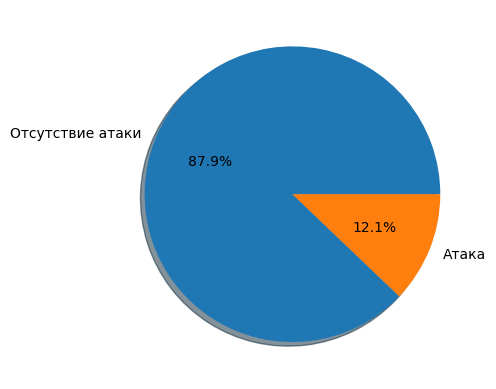

In [17]:
# проанализируем категориальные данные по общей выборке по целевому признаку
display(data_clean['state'].value_counts())
# построим круговую диаграмму
labels = 'Отсутствие атаки', 'Атака'
fig1, ax1 = plt.subplots()
ax1.pie(data_clean['state'].value_counts(), labels=labels, shadow=True, autopct='%1.1f%%')
plt.show()

Доля инцидентов в выборке составляет 12.1%, доля периодов с отсутствием инцидентов 87.9%. Можно сделать вывод, что в целом в выборке **имеется перекос в сторону положительного класса(отсутствие инцидентов), что может вызвать дисбаланс при дальнейшем построении моделей и сформированная часть данных для этапов может негативно влиять на сами этапы обучения, валидации и тестирования по причине того, что на каждом из этапов баланс классов наличия/отсутствия инцидентов может перевешивать в ту или иную сторону.**

Проанализируем временной ряд - выделим периоды наличия и отсутствия атак, отметим выбросы и закономерности при их наличии.

<Axes: xlabel='time_stamp'>

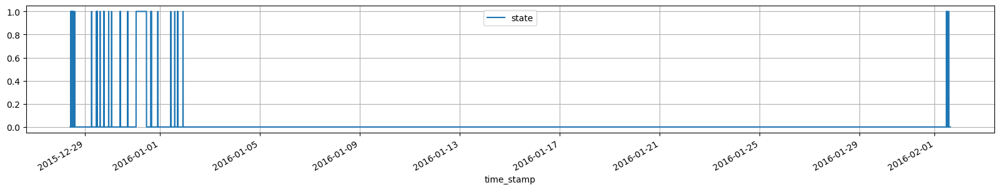

In [18]:
# визуально определим когда происходило наибольшее количество инцидентов - конец декабря 2015г., начало января 2016г., начало февраля 2016г.
# также следует отметить, что визуально нет причин добавлять признаки связанные с датой и временем(неделя, день недели, часы), т.к. выборка за период
# достаточно ограниченная и распределение инцидентов во времени не имеет четко выраженного характера
data_clean.pivot_table(index='time_stamp', values='state', aggfunc='sum').plot(grid=True, figsize=(20, 3))

In [19]:
# подготовим тестовый наббор данных для графиков
plot_data_clean = data_clean
plot_data_clean = plot_data_clean.set_index('time_stamp').sort_index()
display(plot_data_clean.head(5))

,fit_101,lit_101,mv_101,p_101,p_102,ait_201,ait_202,ait_203,fit_201,mv_201,p_201,p_203,p_204,p_205,p_206,dpit_301,fit_301,lit_301,mv_301,mv_302,mv_303,mv_304,p_302,ait_401,ait_402,fit_401,lit_401,p_402,p_403,uv_401,ait_501,ait_502,ait_503,ait_504,fit_501,fit_502,fit_503,fit_504,p_501,pit_501,pit_502,pit_503,fit_601,p_602,state
time_stamp,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2015-12-28 10:00:00,2.427057,522.8467,2,2,1,262.0161,8.396437,328.6337,2.445391,2,1,2,1,2,1,19.74838,2.206835,956.1651,1,2,1,1,2,148.808,156.0882,1.713517,942.0662,2,1,2,7.878621,145.1166,264.5475,12.03538,1.723789,1.279621,0.735269,0.307786,2,250.8652,1.649953,189.5988,0.000128,1,0
2015-12-28 10:00:01,2.446274,522.8860,2,2,1,262.0161,8.396437,328.6337,2.445391,2,1,2,1,2,1,19.74838,2.208244,956.1651,1,2,1,1,2,148.808,156.0882,1.715952,942.0277,2,1,2,7.878621,145.1166,264.5475,12.03538,1.723789,1.297554,0.735269,0.307786,2,250.8652,1.649953,189.6789,0.000128,1,0
2015-12-28 10:00:02,2.489191,522.8467,2,2,1,262.0161,8.394514,328.6337,2.442316,2,1,2,1,2,1,19.69076,2.208628,956.4855,1,2,1,1,2,148.808,156.0882,1.715952,941.8739,2,1,2,7.878621,145.1166,264.5475,12.03538,1.723404,1.293967,0.735269,0.308619,2,250.8812,1.649953,189.6789,0.000128,1,0
2015-12-28 10:00:03,2.534350,522.9645,2,2,1,262.0161,8.394514,328.6337,2.442316,2,1,2,1,2,1,19.69076,2.208628,956.8060,1,2,1,1,2,148.808,156.0882,1.714670,941.7970,2,1,2,7.878621,145.0141,264.5475,12.03538,1.723404,1.281158,0.735269,0.308619,2,250.8812,1.649953,189.6148,0.000128,1,0
2015-12-28 10:00:04,2.569260,523.4748,2,2,1,262.0161,8.394514,328.6337,2.443085,2,1,2,1,2,1,19.69076,2.208628,957.0864,1,2,1,1,2,148.808,156.0882,1.714670,942.2200,2,1,2,7.878621,144.8859,264.5475,12.03538,1.723404,1.281158,0.735269,0.308619,2,250.8812,1.649953,189.5027,0.000128,1,0


<Axes: xlabel='time_stamp'>

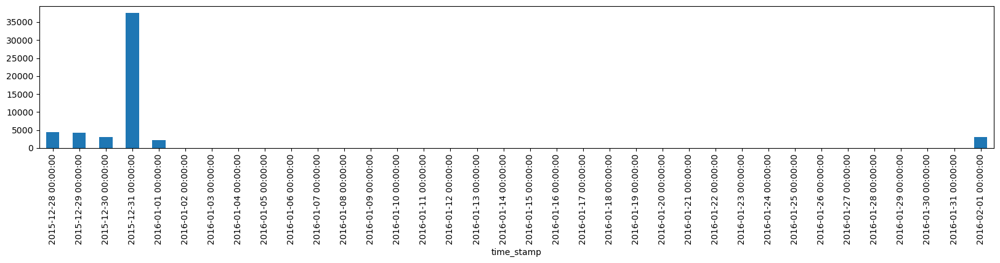

In [20]:
# посмотрим статистику атак по дням - по графику отсутствует закономерность
plot_data_clean.resample('D')['state'].sum().plot(kind='bar', figsize=(20, 3))

<Axes: xlabel='time_stamp'>

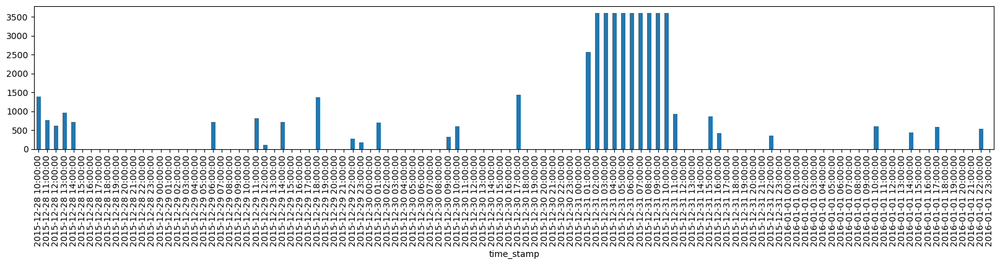

In [21]:
# посмотрим статистику атак по часам - по графику отсутствует закономерность
plot_data_clean.loc[:'2016-01-01 23:59:59'].resample('H')['state'].sum().plot(kind='bar', figsize=(20, 3))

In [22]:
# обзор распределения показателей признаков во времени - реакция на атаки
sns.set_theme(style="whitegrid", palette="pastel")
n_cols = len(plot_data_clean.columns)
fig, axes = plt.subplots(n_cols, 1, figsize=(40, 3*n_cols))

for i, col in enumerate(plot_data_clean.columns):
    sns.lineplot(data=plot_data_clean.loc[:'2016-01-01 23:59:59'], x=plot_data_clean.loc[:'2016-01-01 23:59:59'].index, y=col, ax=axes[i], ci=None)
    axes[i].set_title(col, fontsize=14)
    
plt.tight_layout(pad=3.0)

Отметим следующие наблюдения по выборке:
- длительность периода с атаками - 6 дней(28.12.2015г.- 01.01.2016г., 01.02.2016г.),
- длительность периода без атак - 30 дней(02.01.2016г.- 31.01.2016г.).

По графику отсутствует закономерность, но график в крайнем левом блоке(блок с ресемплированием до дней) по характеру распределение аттак может напоминать нормальное распределение, однако присутствуют выбросы, проанализировали период с 28.12.2015г. по 01.01.2016г. в моменты увеличения интенсивности атак - распределение неравномерное. Построив линейные графики изменения показателей признаков во времени можно предположить, что в периоды без атак показатели на графиках имеет цикличный волновой характер. 


state
0    344436
1     51483
Name: count, dtype: int64

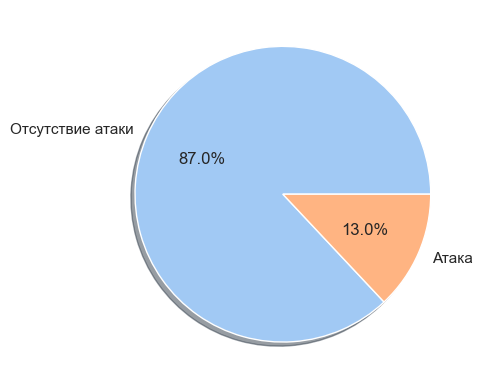

In [23]:
# проанализируем категориальные данные по сокращенной выборке за период с 28.12.2015г. по 01.01.2016г. по целевому признаку
display(plot_data_clean.loc[:'2016-01-01 23:59:59']['state'].value_counts())
# построим круговую диаграмму
labels = 'Отсутствие атаки', 'Атака'
fig1, ax1 = plt.subplots()
ax1.pie(plot_data_clean.loc[:'2016-01-01 23:59:59']['state'].value_counts(), labels=labels, shadow=True, autopct='%1.1f%%')
plt.show()

Для дальнейшего исследования необходимо устранить дисбаланс между классами(атак/отсутствие атаки), кроме того, ввиду визуально определенного волнового и импульсного характера изменения основных признаков в периоды без атак - риск снижения качества моделей отсутствует. Данный дисбаланс возможно устранить при помощи Undersampling, т.е. снижения выборки класса - отсутствие атак и перемешивание данных расположенных по временной шкале.

Проверим выборку на предмет наличия мультиколлинеарности признаков. Для этого построим heatmap и выделим признаки для удаления, которые имеют корреляцию между собой более +/-0,85(экспертно).

In [24]:
corr_data_clean = plot_data_clean.loc[:'2016-01-01 23:59:59']

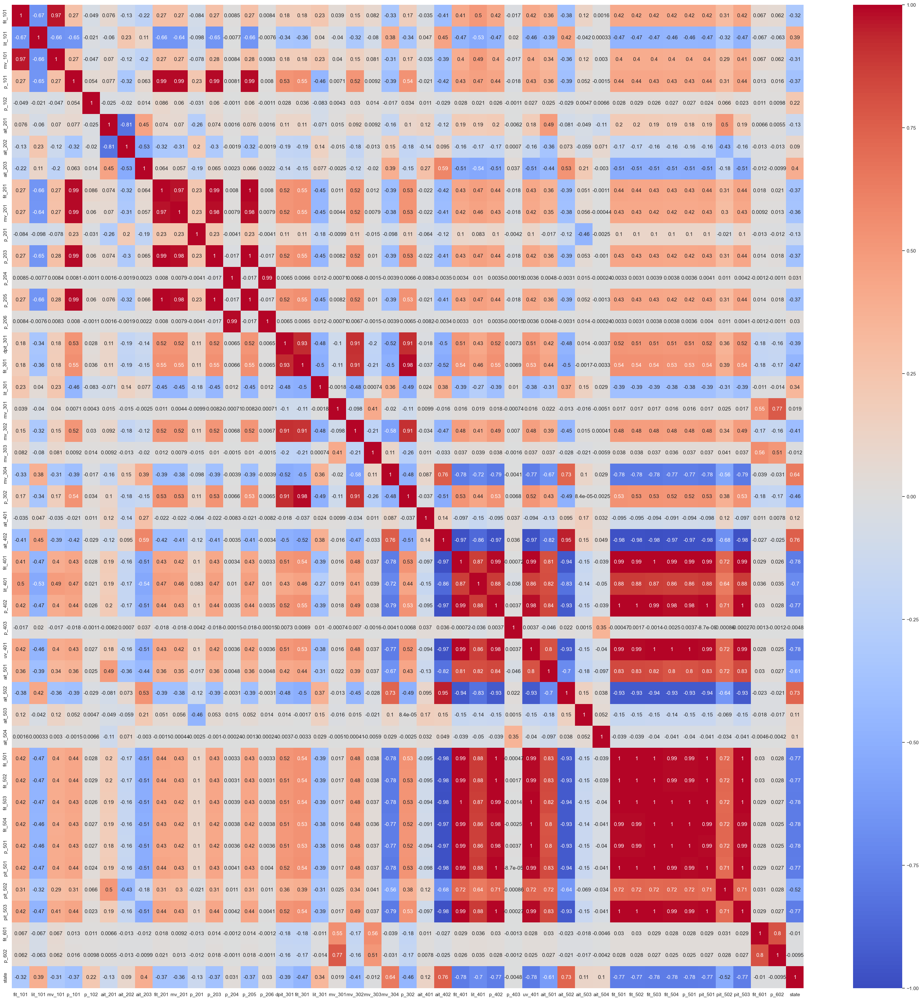

In [25]:
# построим хитмэп для наглядного отображения корреляций
plt.figure(figsize=(40,40))
sns.heatmap(corr_data_clean.corr(), vmin=-1, vmax=1, annot=True, cmap='coolwarm')
plt.show()

In [26]:
# удаляем признаки с высокой степенью корреляции
corr_data_clean = corr_data_clean.drop(columns=['fit_502','fit_503','fit_504','p_501','pit_501','pit_503','fit_401','lit_401',
                                                'p_402','ait_402','uv_401','ait_502','p_302','dpit_301','mv_101','p_101','fit_201','mv_201','p_203',
                                                'p_205','p_204','mv_302'], axis=1)

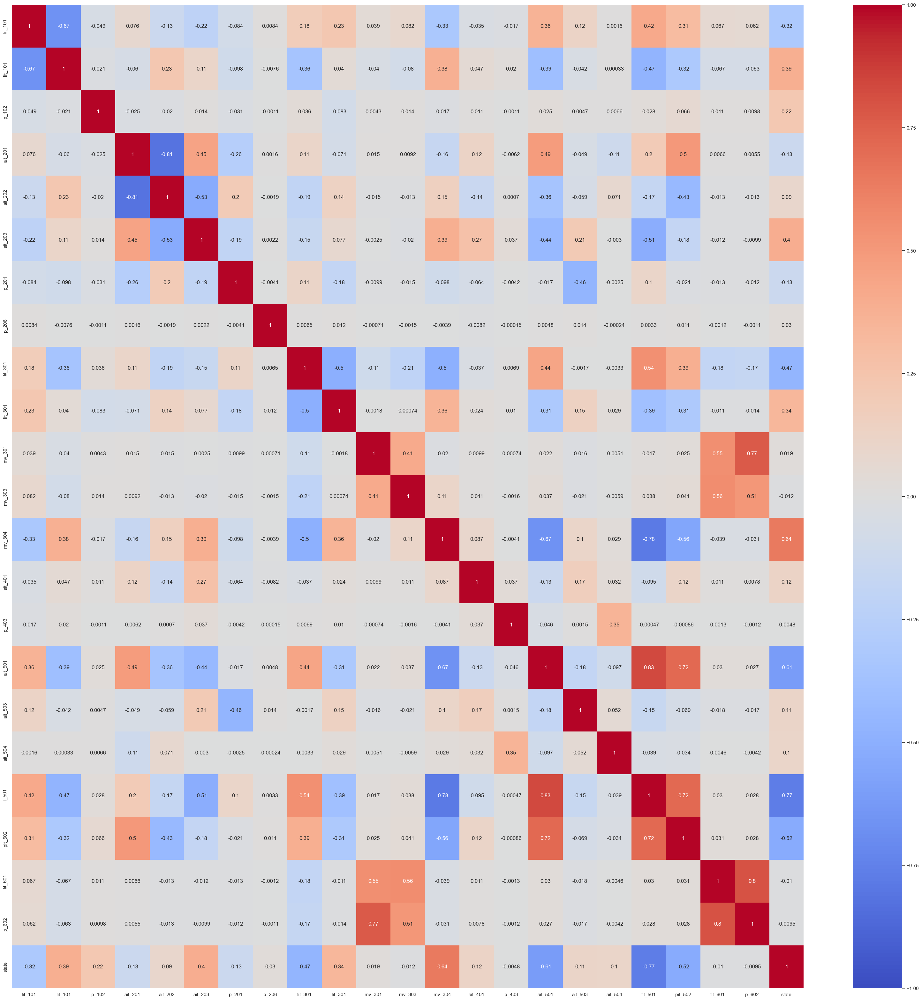

In [27]:
# проверим корреляции
plt.figure(figsize=(40,40))
sns.heatmap(corr_data_clean.corr(), vmin=-1, vmax=1, annot=True, cmap='coolwarm')
plt.show()

In [28]:
# получим корреляции с целевым признаком
display(corr_data_clean.corr()[['state']])

,state
fit_101,-0.318349
lit_101,0.387816
p_102,0.222562
ait_201,-0.127731
ait_202,0.089620
ait_203,0.396459
p_201,-0.131871
p_206,0.030488
fit_301,-0.468510
lit_301,0.337288


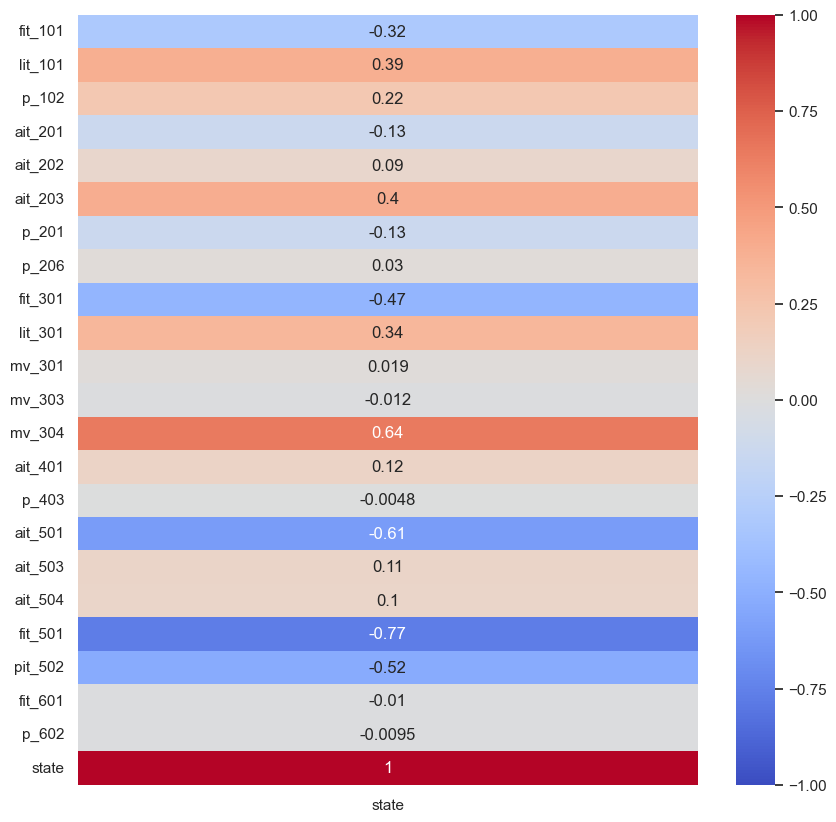

In [29]:
# построим хитмэп по целевому признаку и выявим корреляции
plt.figure(figsize=(10,10))
sns.heatmap(corr_data_clean.corr()[['state']], vmin=-1, vmax=1, annot=True, cmap='coolwarm')
plt.show()

В выборке присутствуют как сильные прямые(0,64), так и сильные обратные корреляции(0,77), но утечки признаков не наблюдается.

### Вывод

В данном блоке было проанализировано и выявлено:
- доля инцидентов в выборке составляет 12.1%, доля периодов с отсутствием инцидентов 87.9%, присуствтует дисбаланс классов, необходимо снижение дисбаланса классов путем Undersampling с перемешиванием данных выборки;
- выделены признаки для удаления, которые имеют корреляцию между собой более +/-0,85(экспертно): fit_502, fit_503, fit_504, p_501, pit_501, pit_503, fit_401, lit_401, p_402, ait_402, uv_401, ait_502, p_302, dpit_301, mv_101, p_101, fit_201, mv_201, p_203, p_205, p_204, mv_302.

## 4. Стандартизация признаков, устранение дисбаланса и формирование критериев оценки моделей

In [30]:
# удаляем временной индекс
standart_data = corr_data_clean
standart_data = standart_data.reset_index(drop=True)
display(standart_data.head(5))

,fit_101,lit_101,p_102,ait_201,ait_202,ait_203,p_201,p_206,fit_301,lit_301,mv_301,mv_303,mv_304,ait_401,p_403,ait_501,ait_503,ait_504,fit_501,pit_502,fit_601,p_602,state
0,2.427057,522.8467,1,262.0161,8.396437,328.6337,1,1,2.206835,956.1651,1,1,1,148.808,1,7.878621,264.5475,12.03538,1.723789,1.649953,0.000128,1,0
1,2.446274,522.8860,1,262.0161,8.396437,328.6337,1,1,2.208244,956.1651,1,1,1,148.808,1,7.878621,264.5475,12.03538,1.723789,1.649953,0.000128,1,0
2,2.489191,522.8467,1,262.0161,8.394514,328.6337,1,1,2.208628,956.4855,1,1,1,148.808,1,7.878621,264.5475,12.03538,1.723404,1.649953,0.000128,1,0
3,2.534350,522.9645,1,262.0161,8.394514,328.6337,1,1,2.208628,956.8060,1,1,1,148.808,1,7.878621,264.5475,12.03538,1.723404,1.649953,0.000128,1,0
4,2.569260,523.4748,1,262.0161,8.394514,328.6337,1,1,2.208628,957.0864,1,1,1,148.808,1,7.878621,264.5475,12.03538,1.723404,1.649953,0.000128,1,0


In [31]:
# разделим выборку на тренировочный и тестовый блоки с перемешиванием для устранения риска дисбаланса
target = standart_data['state']
features = standart_data.drop('state', axis=1)
features_train, features_test, target_train, target_test = train_test_split(features, target, test_size=0.3, shuffle=True, random_state=654321)
display(features_train.info())
display(features_test.info())
display(target_train.info())
display(target_test.info())

<class 'pandas.core.frame.DataFrame'>
Index: 277143 entries, 23342 to 259568
Data columns (total 22 columns):
 #   Column   Non-Null Count   Dtype  
---  ------   --------------   -----  
 0   fit_101  277143 non-null  float64
 1   lit_101  277143 non-null  float64
 2   p_102    277143 non-null  int64  
 3   ait_201  277143 non-null  float64
 4   ait_202  277143 non-null  float64
 5   ait_203  277143 non-null  float64
 6   p_201    277143 non-null  int64  
 7   p_206    277143 non-null  int64  
 8   fit_301  277143 non-null  float64
 9   lit_301  277143 non-null  float64
 10  mv_301   277143 non-null  int64  
 11  mv_303   277143 non-null  int64  
 12  mv_304   277143 non-null  int64  
 13  ait_401  277143 non-null  float64
 14  p_403    277143 non-null  int64  
 15  ait_501  277143 non-null  float64
 16  ait_503  277143 non-null  float64
 17  ait_504  277143 non-null  float64
 18  fit_501  277143 non-null  float64
 19  pit_502  277143 non-null  float64
 20  fit_601  277143 non-null  f

None

<class 'pandas.core.frame.DataFrame'>
Index: 118776 entries, 392894 to 85410
Data columns (total 22 columns):
 #   Column   Non-Null Count   Dtype  
---  ------   --------------   -----  
 0   fit_101  118776 non-null  float64
 1   lit_101  118776 non-null  float64
 2   p_102    118776 non-null  int64  
 3   ait_201  118776 non-null  float64
 4   ait_202  118776 non-null  float64
 5   ait_203  118776 non-null  float64
 6   p_201    118776 non-null  int64  
 7   p_206    118776 non-null  int64  
 8   fit_301  118776 non-null  float64
 9   lit_301  118776 non-null  float64
 10  mv_301   118776 non-null  int64  
 11  mv_303   118776 non-null  int64  
 12  mv_304   118776 non-null  int64  
 13  ait_401  118776 non-null  float64
 14  p_403    118776 non-null  int64  
 15  ait_501  118776 non-null  float64
 16  ait_503  118776 non-null  float64
 17  ait_504  118776 non-null  float64
 18  fit_501  118776 non-null  float64
 19  pit_502  118776 non-null  float64
 20  fit_601  118776 non-null  f

None

<class 'pandas.core.series.Series'>
Index: 277143 entries, 23342 to 259568
Series name: state
Non-Null Count   Dtype
--------------   -----
277143 non-null  int64
dtypes: int64(1)
memory usage: 4.2 MB


None

<class 'pandas.core.series.Series'>
Index: 118776 entries, 392894 to 85410
Series name: state
Non-Null Count   Dtype
--------------   -----
118776 non-null  int64
dtypes: int64(1)
memory usage: 1.8 MB


None

In [32]:
# по итогам проведенного анализа массива данных возможно подтвердить, что признаки имеют разный масштаб и для дальнейшего 
# моделирования необходимо стандартизировать все признаки
scaler = StandardScaler()
features_train_scaled = scaler.fit_transform(features_train)
features_test_scaled = scaler.transform(features_test)
display(features_train_scaled.shape)
display(features_test_scaled.shape)

(277143, 22)

(118776, 22)

In [33]:
# сбалансируем тренировочный набор
sampler = RandomUnderSampler(sampling_strategy='auto', random_state=654321)
features_train_resampled, target_train_resampled = sampler.fit_resample(features_train_scaled, target_train)

print('Выборка до андерсемплинга:')
print(f'Признаки: {features_train_scaled.shape}, Цель: {target_train.shape}')
print('\nРазмеры после андерсемплинга:')
print(f'Признаки: {features_train_resampled.shape}, Цель: {target_train_resampled.shape}')
print('\nРаспределение классов после балансировки:')
print(pd.Series(target_train_resampled).value_counts())

Выборка до андерсемплинга:
Признаки: (277143, 22), Цель: (277143,)

Размеры после андерсемплинга:
Признаки: (72194, 22), Цель: (72194,)

Распределение классов после балансировки:
state
0    36097
1    36097
Name: count, dtype: int64


Рассмотрим метрики для моделей классификации, которые будет необходимо использовать для определения качества модели:
1. Средняя точность(accuracy) - доля корректно класифицированных объектов в общей массе((TP + TN) / (TP + TN + FP + FN));
2. Доля предсказанных положительных случаев(precision) - TP / (TP + FP);
3. **Полнота(recall) - какая доля предсказанных положительных случаев(TP / (TP + FN))(это наиболее важная метрика в задачах обнаружения атак и наша задача - обнаружить как можно больше атак(минимизировать FN)), поэтому в качестве основной метрики для моделей выберем данную метрику;**
4. Точность и полнота(F1) - гармоническое среднее между полнотой и точностью(2 * (Precision * Recall) / (Precision + Recall);
5. Качество бинарной классификации(roc_auc) - способность модели ранжировать положительные примеры выше отрицательных(1,0 — идеальная классификация, 0,5 — случайное угадывание, 0,0 — полностью неверная классификация).

Рассмотрим имеющиеся модели классификации для сравнения результатов:
1. DecisionTreeClassifier - бинарное дерево;
2. LogisticRegression - линейный классификатор, позволяющий оценивать вероятности принадлежности объектов классам;
3. RandomForestClassifier - объединяет несколько деревьев решений для улучшения точности и устойчивости модели;
4. LGBMClassifier - реализация деревьев принятия решений с градиентным бустингом;
5. DummyClassifier - простейшая модель-эталон для определения адекватности результатов других моделей.


### Вывод

В данном разделе была осуществлена подготовка к работе с моделями:
1. Разделены выборки на тренировочный и тестовый блоки с перемешиванием для устранения риска дисбаланса;
2. Признаки были масштабированы базовым инструментом StandardScaler;
3. Тренировочный набор был сбалансирован методом RandomUnderSampler с понижением объема выборки;
4. Был определены метрики моделей классификации, которыми будут оцениваться модели;
5. Был определен перечень моделей для оценки результатов и дальнейшего сравнения эффективности.

## 5. Работа с моделями, оценка результатов

### Модель DecisionTreeClassifier

In [34]:
%%time
# получим лучшие параметры DecisionTreeClassifier
params = {'splitter': ['best', 'random'], # перебор всех возможных разделений в узлах/случайным образом из лучших вариантов
          'criterion': ['gini', 'entropy', 'log_loss'], # функция измерения качества разделения
          'min_samples_split': [20, 50, 75], # минимальный порог разделения узлов для защиты от переобучения - лучше при дисбалансе
          'min_samples_leaf': [10, 20, 50], # листы содержат статистически значимое количество образцов
          'max_depth': [5, 10, 20, 50], # максимальная глубина дерева
          'class_weight': [None],
          'random_state': [654321]}
dtc = DecisionTreeClassifier()
grid_dtc = GridSearchCV(dtc, params, scoring='recall', cv=5, n_jobs=-1, verbose=1)
grid_dtc.fit(features_train_resampled, target_train_resampled)
display(grid_dtc.best_params_)

Fitting 5 folds for each of 216 candidates, totalling 1080 fits


{'class_weight': None,
 'criterion': 'entropy',
 'max_depth': 20,
 'min_samples_leaf': 10,
 'min_samples_split': 20,
 'random_state': 654321,
 'splitter': 'best'}

CPU times: total: 7.66 s
Wall time: 1min 18s


In [35]:
%%time
# кроссвалидация на модели DecisionTreeClassifier
dtc = DecisionTreeClassifier(random_state=654321, criterion='entropy', class_weight=None,
                             splitter='best', max_depth=20, min_samples_leaf=10, min_samples_split=20)
scoring = {
    'accuracy' : 'accuracy',
    'precision' : 'precision',
    'recall' : 'recall',
    'f1' : 'f1',
    'roc_auc' : 'roc_auc'
}
scores = []
scores = cross_validate(dtc, features_train_resampled, target_train_resampled, cv=5, scoring=scoring, n_jobs = -1, return_estimator=True)
print('Средняя точность(accuracy):', scores['test_accuracy'].mean())
print('Доля предсказанных положительных случаев(precision):', scores['test_precision'].mean())
print('Полнота(recall):', scores['test_recall'].mean())
print('Точность и полнота(F1):', scores['test_f1'].mean())
print('Качество бинарной классификации(roc_auc):', scores['test_roc_auc'].mean())

Средняя точность(accuracy): 0.994653297394206
Доля предсказанных положительных случаев(precision): 0.9944619067692478
Полнота(recall): 0.9948471849639627
Точность и полнота(F1): 0.9946542482872112
Качество бинарной классификации(roc_auc): 0.9988527909920604
CPU times: total: 46.9 ms
Wall time: 894 ms


In [36]:
%%time
# получим метрики для модели DecisionTreeClassifier
dtc.fit(features_train_resampled, target_train_resampled) # тренируем модель для опробирования на тестовой выборке
predictions = dtc.predict(features_test_scaled) # пробуем модель на тестовой выборке

dtc_accuracy_score = accuracy_score(target_test, predictions)
print('Средняя точность(accuracy):', accuracy_score(target_test, predictions))

dtc_precision_score = precision_score(target_test, predictions)
print('Доля предсказанных положительных случаев(precision):', precision_score(target_test, predictions))

dtc_recall_score = recall_score(target_test, predictions)
print('Полнота(recall):', recall_score(target_test, predictions))

dtc_f1_score = f1_score(target_test, predictions)
print('Точность и полнота(F1):', f1_score(target_test, predictions))

dtc_roc_auc_score = roc_auc_score(target_test, predictions)
print('Качество бинарной классификации(roc_auc):', roc_auc_score(target_test, predictions))

print(classification_report(target_test, predictions))

Средняя точность(accuracy): 0.9951589546709773
Доля предсказанных положительных случаев(precision): 0.9660771602995784
Полнота(recall): 0.9976602105810477
Точность и полнота(F1): 0.9816147082334132
Качество бинарной классификации(roc_auc): 0.9962234702194338
              precision    recall  f1-score   support

           0       1.00      0.99      1.00    103390
           1       0.97      1.00      0.98     15386

    accuracy                           1.00    118776
   macro avg       0.98      1.00      0.99    118776
weighted avg       1.00      1.00      1.00    118776

CPU times: total: 1.08 s
Wall time: 1.07 s


### Модель LogisticRegression

In [37]:
%%time
# получим лучшие параметры LogisticRegression
params = {'class_weight': [None], # balance - автоматический расчет весов классов для выборки с дисбалансом, None
          'penalty': ['l1', 'l2'], # тип регуляризации, помогает предотвратить переобучение: l1 -обнуляет коэффициенты нерелевантных признаков
# выполняет автоматический отбор признаков, когда признаков очень много, l2 - уменьшает все коэффициенты, но не обнуляет их.
          'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'], # экспериментируем с алгоритмами оптимизации
         'random_state': [654321]}
lr = LogisticRegression()
grid_lr = GridSearchCV(lr, params, scoring='recall', cv=5, n_jobs=-1, verbose=1)
grid_lr.fit(features_train_resampled, target_train_resampled)
display(grid_lr.best_params_)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


{'class_weight': None,
 'penalty': 'l1',
 'random_state': 654321,
 'solver': 'liblinear'}

CPU times: total: 1.08 s
Wall time: 14.8 s


In [38]:
%%time
# кроссвалидация на модели LogisticRegression
lr = LogisticRegression(class_weight=None, penalty='l1', random_state=654321, solver='liblinear')
scoring = {
    'accuracy' : 'accuracy',
    'precision' : 'precision',
    'recall' : 'recall',
    'f1' : 'f1',
    'roc_auc' : 'roc_auc'
}
scores = []
scores = cross_validate(lr, features_train_resampled, target_train_resampled, cv=5, scoring=scoring, n_jobs = -1)
print('Средняя точность(accuracy):', scores['test_accuracy'].mean())
print('Доля предсказанных положительных случаев(precision):', scores['test_precision'].mean())
print('Полнота(recall):', scores['test_recall'].mean())
print('Точность и полнота(F1):', scores['test_f1'].mean())
print('Качество бинарной классификации(roc_auc):', scores['test_roc_auc'].mean())

Средняя точность(accuracy): 0.8650719242563311
Доля предсказанных положительных случаев(precision): 0.942577786899055
Полнота(recall): 0.7775160078877723
Точность и полнота(F1): 0.8521191813262574
Качество бинарной классификации(roc_auc): 0.9319547403242854
CPU times: total: 62.5 ms
Wall time: 2.42 s


In [39]:
%%time
# получим метрики для модели LogisticRegression
lr.fit(features_train_resampled, target_train_resampled)
predictions = lr.predict(features_test_scaled)

lr_accuracy_score = accuracy_score(target_test, predictions)
print('Средняя точность(accuracy):', accuracy_score(target_test, predictions))

lr_precision_score = precision_score(target_test, predictions)
print('Доля предсказанных положительных случаев(precision):', precision_score(target_test, predictions))

lr_recall_score = recall_score(target_test, predictions)
print('Полнота(recall):', recall_score(target_test, predictions))

lr_f1_score = f1_score(target_test, predictions)
print('Точность и полнота(F1):', f1_score(target_test, predictions))

lr_roc_auc_score = roc_auc_score(target_test, predictions)
print('Качество бинарной классификации(roc_auc):', roc_auc_score(target_test, predictions))

print(classification_report(target_test, predictions))

Средняя точность(accuracy): 0.9312318987000741
Доля предсказанных положительных случаев(precision): 0.7139046941678521
Полнота(recall): 0.7828545430911218
Точность и полнота(F1): 0.7467914935829871
Качество бинарной классификации(roc_auc): 0.8680836212892499
              precision    recall  f1-score   support

           0       0.97      0.95      0.96    103390
           1       0.71      0.78      0.75     15386

    accuracy                           0.93    118776
   macro avg       0.84      0.87      0.85    118776
weighted avg       0.93      0.93      0.93    118776

CPU times: total: 1.12 s
Wall time: 1.13 s


### Модель RandomForestClassifier

In [40]:
%%time
# получим лучшие параметры RandomForestClassifier экспериментируя с параметрами
params = {'n_estimators': [20, 40], # количество деревьев в лесу
          'criterion': ['gini', 'entropy', 'log_loss'], # функция измерения качества разделения
          'min_samples_split': [20, 30], # минимальный порог разделения узлов для защиты от переобучения - лучше при дисбалансе
          'min_samples_leaf': [10, 20], # листы содержат статистически значимое количество образцов
          'max_depth': [10, 25, 50], # максимальная глубина дерева
          'class_weight': [None],
          'bootstrap': [True, False],
         'random_state': [654321]}
rfc = RandomForestClassifier()
grid_rfc = GridSearchCV(rfc, params, scoring='recall', cv=5, n_jobs=-1, verbose=1)
grid_rfc.fit(features_train_resampled, target_train_resampled)
display(grid_rfc.best_params_)

Fitting 5 folds for each of 144 candidates, totalling 720 fits


{'bootstrap': False,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': 25,
 'min_samples_leaf': 10,
 'min_samples_split': 30,
 'n_estimators': 40,
 'random_state': 654321}

CPU times: total: 11.3 s
Wall time: 5min 12s


In [41]:
%%time
# кроссвалидация на модели RandomForestClassifier
rfc = RandomForestClassifier(random_state=654321, bootstrap=False, class_weight=None, criterion='gini', max_depth=25, min_samples_leaf=10,
                             min_samples_split=30, n_estimators=40)
scoring = {
    'accuracy' : 'accuracy',
    'precision' : 'precision',
    'recall' : 'recall',
    'f1' : 'f1',
    'roc_auc' : 'roc_auc'
}
scores = []
scores = cross_validate(rfc, features_train_resampled, target_train_resampled, cv=5, scoring=scoring, n_jobs = -1)
print('Средняя точность(accuracy):', scores['test_accuracy'].mean())
print('Доля предсказанных положительных случаев(precision):', scores['test_precision'].mean())
print('Полнота(recall):', scores['test_recall'].mean())
print('Точность и полнота(F1):', scores['test_f1'].mean())
print('Качество бинарной классификации(roc_auc):', scores['test_roc_auc'].mean())

Средняя точность(accuracy): 0.9982408543007584
Доля предсказанных положительных случаев(precision): 0.9973179092628548
Полнота(recall): 0.9991688868133837
Точность и полнота(F1): 0.9982424854268871
Качество бинарной классификации(roc_auc): 0.9999696662113611
CPU times: total: 78.1 ms
Wall time: 5.98 s


In [42]:
%%time
# получим метрики для модели RandomForestClassifier
rfc.fit(features_train_resampled, target_train_resampled)
predictions = rfc.predict(features_test_scaled)

rfc_accuracy_score = accuracy_score(target_test, predictions)
print('Средняя точность(accuracy):', accuracy_score(target_test, predictions))

rfc_precision_score = precision_score(target_test, predictions)
print('Доля предсказанных положительных случаев(precision):', precision_score(target_test, predictions))

rfc_recall_score = recall_score(target_test, predictions)
print('Полнота(recall):', recall_score(target_test, predictions))

rfc_f1_score = f1_score(target_test, predictions)
print('Точность и полнота(F1):', f1_score(target_test, predictions))

rfc_roc_auc_score = roc_auc_score(target_test, predictions)
print('Качество бинарной классификации(roc_auc):', roc_auc_score(target_test, predictions))

print(classification_report(target_test, predictions))

Средняя точность(accuracy): 0.9980046474035159
Доля предсказанных положительных случаев(precision): 0.9856382637686735
Полнота(recall): 0.9991550760431561
Точность и полнота(F1): 0.9923506439014944
Качество бинарной классификации(roc_auc): 0.9984942611089173
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    103390
           1       0.99      1.00      0.99     15386

    accuracy                           1.00    118776
   macro avg       0.99      1.00      1.00    118776
weighted avg       1.00      1.00      1.00    118776

CPU times: total: 5.45 s
Wall time: 5.5 s


### Модель LGBMClassifier

In [43]:
%%time
# получим лучшие параметры LGBMClassifier
params = {'max_depth': [10, 50, 100],
          'num_leaves': [10, 50, 100],
          'boosting_type': ['gbdt','dart','goss','rf'], # gbdt-стандартный, dart-устойчивый к переобучению, goss-фокус на больших градиентах, rf - RandomForest
          'n_estimators': [20,50,100], # количество деревьев
          'random_state': [654321]}
lgbmc = lgbm.LGBMClassifier(is_unbalance=False, objective='binary', n_jobs=-1, verbose=1)
grid_lgbmc = GridSearchCV(lgbmc, params, scoring='recall', cv=5)
grid_lgbmc.fit(features_train_resampled, target_train_resampled)
display(grid_lgbmc.best_params_)

[LightGBM] [Info] Number of positive: 28878, number of negative: 28877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005844 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3070
[LightGBM] [Info] Number of data points in the train set: 57755, number of used features: 21
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500009 -> initscore=0.000035
[LightGBM] [Info] Start training from score 0.000035
[LightGBM] [Info] Number of positive: 28878, number of negative: 28877
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005713 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3072
[LightGBM] [Info] Number of data points in the train set: 57755, number of used features: 21
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500009 -> initscore=0.000035
[LightGBM] [Info] Start training from score 0.000035
[LightGBM] [Info

{'boosting_type': 'gbdt',
 'max_depth': 50,
 'n_estimators': 100,
 'num_leaves': 100,
 'random_state': 654321}

CPU times: total: 25min 50s
Wall time: 2min 39s


In [44]:
%%time
# кроссвалидация на модели LGBMClassifier
lgbmc = lgbm.LGBMClassifier(random_state=654321, boosting_type='gbdt', n_estimators=100, objective='binary', verbosity=-1, max_depth=50, num_leaves=100)
scoring = {
    'accuracy' : 'accuracy',
    'precision' : 'precision',
    'recall' : 'recall',
    'f1' : 'f1',
    'roc_auc' : 'roc_auc'
}
scores = []
scores = cross_validate(lgbmc, features_train_resampled, target_train_resampled, cv=5, scoring=scoring, n_jobs = -1)
print('Средняя точность(accuracy):', scores['test_accuracy'].mean())
print('Доля предсказанных положительных случаев(precision):', scores['test_precision'].mean())
print('Полнота(recall):', scores['test_recall'].mean())
print('Точность и полнота(F1):', scores['test_f1'].mean())
print('Качество бинарной классификации(roc_auc):', scores['test_roc_auc'].mean())

Средняя точность(accuracy): 0.9990580969233782
Доля предсказанных положительных случаев(precision): 0.9985334727796271
Полнота(recall): 0.9995844568369326
Точность и полнота(F1): 0.9990585992552748
Качество бинарной классификации(roc_auc): 0.999975942525974
CPU times: total: 734 ms
Wall time: 7.12 s


In [45]:
%%time
# получим метрики для модели LGBMClassifier
lgbmc.fit(features_train_resampled, target_train_resampled)
predictions = lgbmc.predict(features_test_scaled)

lgbmc_accuracy_score = accuracy_score(target_test, predictions)
print('Средняя точность(accuracy):', accuracy_score(target_test, predictions))

lgbmc_precision_score = precision_score(target_test, predictions)
print('Доля предсказанных положительных случаев(precision):', precision_score(target_test, predictions))

lgbmc_recall_score = recall_score(target_test, predictions)
print('Полнота(recall):', recall_score(target_test, predictions))

lgbmc_f1_score = f1_score(target_test, predictions)
print('Точность и полнота(F1):', f1_score(target_test, predictions))

lgbmc_roc_auc_score = roc_auc_score(target_test, predictions)
print('Качество бинарной классификации(roc_auc):', roc_auc_score(target_test, predictions))

print(classification_report(target_test, predictions))

Средняя точность(accuracy): 0.9989475988415168
Доля предсказанных положительных случаев(precision): 0.9921950590208347
Полнота(recall): 0.9997400233978941
Точность и полнота(F1): 0.9959532519667196
Качество бинарной классификации(roc_auc): 0.9992848487238044
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    103390
           1       0.99      1.00      1.00     15386

    accuracy                           1.00    118776
   macro avg       1.00      1.00      1.00    118776
weighted avg       1.00      1.00      1.00    118776

CPU times: total: 5.66 s
Wall time: 1.35 s


### Модель DummyClassifier

In [46]:
# т.к. результаты протестированных ранее моделей оказались достаточно высокими - следует добавить проверку на адекватность данных моделей, 
# такую проверку проведем с простейшей моделью DummyClassifier
dummy = DummyClassifier(strategy="most_frequent")
dummy.fit(features_train_resampled, target_train_resampled)
predictions = dummy.predict(features_test_scaled)

dummy_accuracy_score = accuracy_score(target_test, predictions)
print('Средняя точность(accuracy):', accuracy_score(target_test, predictions))

dummy_precision_score = precision_score(target_test, predictions)
print('Доля предсказанных положительных случаев(precision):', precision_score(target_test, predictions))

dummy_recall_score = recall_score(target_test, predictions)
print('Полнота(recall):', recall_score(target_test, predictions))

dummy_f1_score = f1_score(target_test, predictions)
print('Точность и полнота(F1):', f1_score(target_test, predictions))

dummy_roc_auc_score = roc_auc_score(target_test, predictions)
print('Качество бинарной классификации(roc_auc):', roc_auc_score(target_test, predictions))

print(classification_report(target_test, predictions))

Средняя точность(accuracy): 0.8704620462046204
Доля предсказанных положительных случаев(precision): 0.0
Полнота(recall): 0.0
Точность и полнота(F1): 0.0
Качество бинарной классификации(roc_auc): 0.5
              precision    recall  f1-score   support

           0       0.87      1.00      0.93    103390
           1       0.00      0.00      0.00     15386

    accuracy                           0.87    118776
   macro avg       0.44      0.50      0.47    118776
weighted avg       0.76      0.87      0.81    118776



In [47]:
# сравнение истинных меток и предсказаний
display('Тестовые метки:', target_test)
display('Предсказания:', predictions)

# проверим распределение классов в обучающих данных
unique, counts = np.unique(target_train_resampled, return_counts=True)
print('Распределение классов в обучении:', dict(zip(unique, counts)))
print(classification_report(target_test, predictions))

'Тестовые метки:'

392894    0
95228     0
892       0
289573    0
89344     0
175668    0
140269    0
297508    0
358134    0
52167     0
128373    0
145367    0
71561     0
127016    0
243426    1
102390    0
340989    0
313220    0
256142    1
178926    0
157668    0
165389    0
60253     0
286139    0
276264    0
208497    0
168815    0
331128    0
266121    0
231711    1
65193     0
391304    0
87285     0
236121    1
14461     0
312724    0
348085    1
260056    1
375539    0
193074    0
92628     0
222909    0
272250    0
390727    0
125015    0
178596    0
383642    0
129176    0
102785    0
219924    0
262221    1
6971      0
27655     0
113498    0
87518     0
344943    0
265425    0
346081    0
28842     0
138194    0
307235    0
383269    0
375120    0
295250    0
10476     0
88120     0
116553    0
168875    0
335520    0
303328    0
142538    0
1752      0
106582    0
7942      1
145345    0
80735     0
327198    0
77813     0
343852    0
257366    1
258194    1
82768     0
322878    0
1905

'Предсказания:'

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

Распределение классов в обучении: {0: 36097, 1: 36097}
              precision    recall  f1-score   support

           0       0.87      1.00      0.93    103390
           1       0.00      0.00      0.00     15386

    accuracy                           0.87    118776
   macro avg       0.44      0.50      0.47    118776
weighted avg       0.76      0.87      0.81    118776



## 6. Анализ моделей

#### Сравнение характеристик моделей: точность результата(метрика полноты(recall))

In [48]:
# сформируем сводную таблицу для оценки результатов на тестовой выборке
pivot_data_models = {'Model': ['DecisionTreeClassifier', 'LogisticRegression', 'RandomForestClassifier', 'LGBMClassifier', 'DummyClassifier'],
                        'Средняя точность(accuracy)': [dtc_accuracy_score, lr_accuracy_score, rfc_accuracy_score, lgbmc_accuracy_score, dummy_accuracy_score],
                        'Доля предсказанных положительных случаев(precision)': [dtc_precision_score, lr_precision_score, rfc_precision_score, lgbmc_precision_score, dummy_precision_score],
                        'Полнота(recall)': [dtc_recall_score, lr_recall_score, rfc_recall_score, lgbmc_recall_score, dummy_recall_score],
                        'Точность и полнота(F1)': [dtc_f1_score, lr_f1_score, rfc_f1_score, lgbmc_f1_score, dummy_f1_score],
                        'Качество бинарной классификации(roc_auc)': [dtc_roc_auc_score, lr_roc_auc_score, rfc_roc_auc_score, lgbmc_roc_auc_score, dummy_roc_auc_score]}
pivot_data_models = pd.DataFrame(pivot_data_models)
display(pivot_data_models.sort_values('Полнота(recall)', ascending=False))

,Model,Средняя точность(accuracy),Доля предсказанных положительных случаев(precision),Полнота(recall),Точность и полнота(F1),Качество бинарной классификации(roc_auc)
3,LGBMClassifier,0.998948,0.992195,0.999740,0.995953,0.999285
2,RandomForestClassifier,0.998005,0.985638,0.999155,0.992351,0.998494
0,DecisionTreeClassifier,0.995159,0.966077,0.997660,0.981615,0.996223
1,LogisticRegression,0.931232,0.713905,0.782855,0.746791,0.868084
4,DummyClassifier,0.870462,0.000000,0.000000,0.000000,0.500000


Сравнив характеристики моделей по ключевому выбранному признаку recall(полнота) выявлено, что в рамках ограниченного ресурса тестовой машины с ограниченным набором параметров лучше себя показала модель LGBMClassifier с результатом 0,999740 на тестовой выборке, также она лучше себя проявила по результатам оценки остальных метрик. Данную модель можно рекомендовать для рассмотрения и дальнейшего более глубокого анализа в различных условиях.

В качестве проверки адекватности результатов моделирования было осуществлено сравнение с элементарной моделью угадывания - DummyClassifier, все тестовые модели превзошли результаты данной модели, поэтому можно судить о том, что вывод о выборе лучшей модели обоснован.

#### Анализ значимости факторов модели - победителя

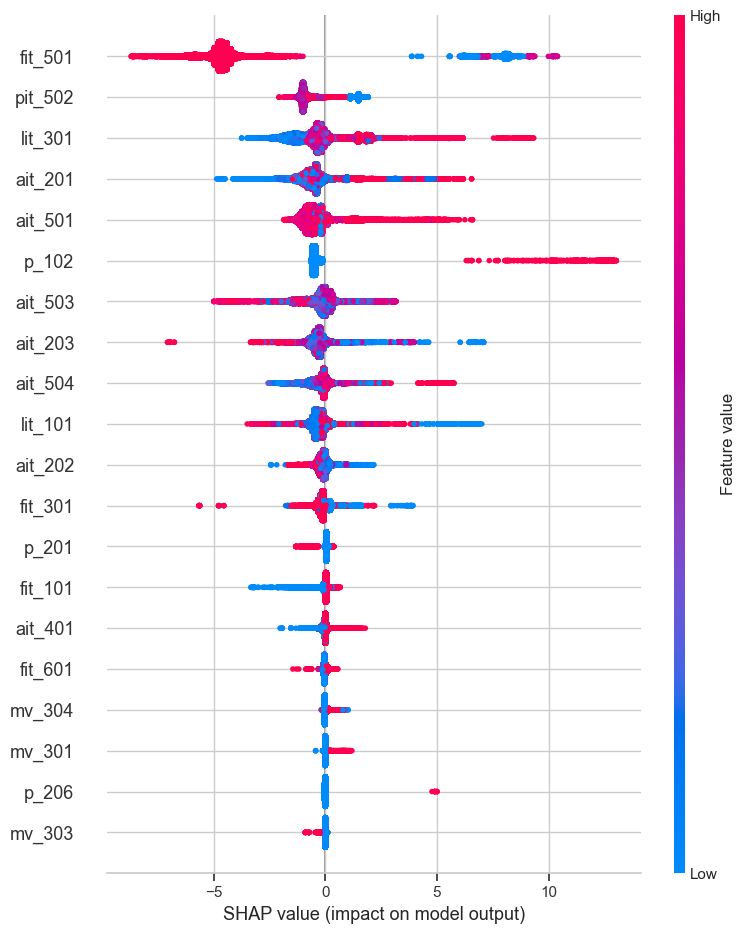

In [49]:
# SHAP-градация значимости факторов модели
features_test_scaled_df = pd.DataFrame(features_test_scaled, columns=features_test.columns)
shap_values = shap.TreeExplainer(lgbmc).shap_values(features_test_scaled_df)
shap.summary_plot(shap_values, features_test_scaled_df)

На графике отсортированы признаки от наиболее важных(сверху) до наименее важных(вниз).

Топ-5 признаков, оказавших наибольшее влияние на показатели модели:
1. fit_501,
2. pit_502,
3. lit_301,
4. ait_201,
5. ait_501.

Также следует обратить внимание на сложное взаимодействие признаков между собой и показания по каждому из признаков(графики зависимости и связь с другими признаками ниже): 
- fit_501 - ait_501, высокая корреляция 0,83(см. таблицу определения мультиколлинеарности), сочетается при взаимном росте признака;
- pit_502 - ait_202, средняя обратная корреляция -0,43, рост признака pit_502 сопровождается снижением показателя признака ait_202;
- lit_301 - ait_504, слабая корреляция 0,029, снижение/консолидация признака lit_301 сопровождается консолидацией признака ait_504;
- ait_201 - lit_301, слабая обратная корреляция -0,071, рост ait_201 сопровождаетя снижением lit_301;
- ait_501 - ait_201, средняя корреляция 0,49, рост ait_501 сопровождается ростом ait_201.


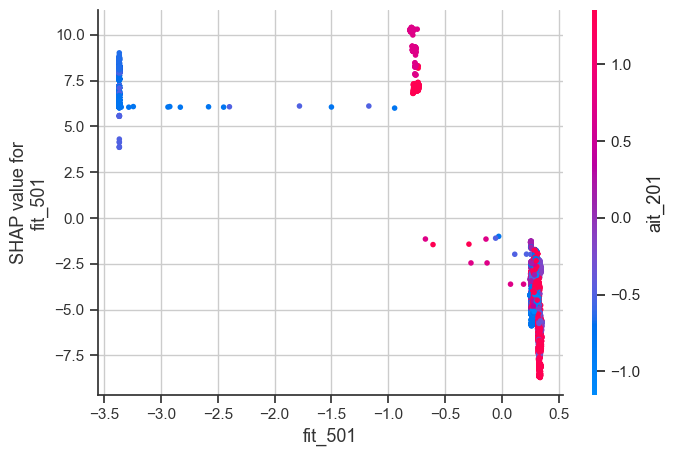

In [50]:
shap.dependence_plot('fit_501', shap_values, features_test_scaled_df)

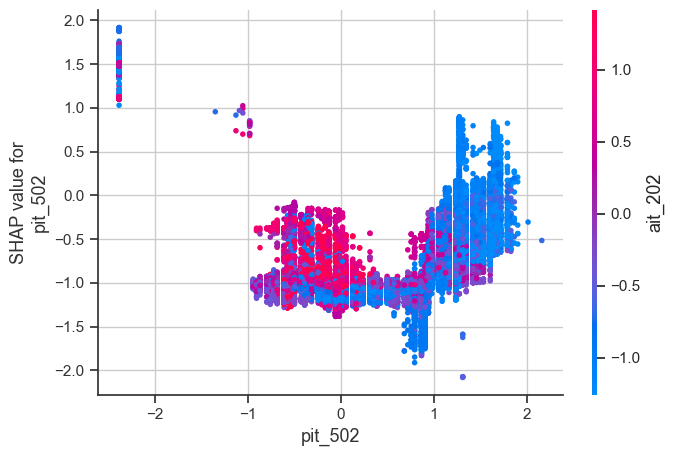

In [51]:
shap.dependence_plot('pit_502', shap_values, features_test_scaled_df)

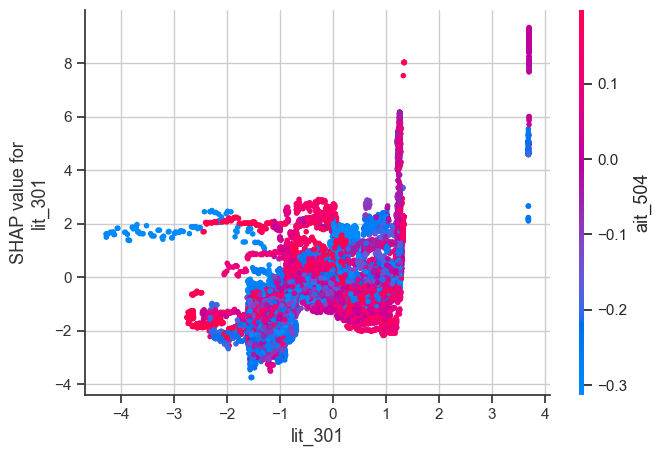

In [52]:
shap.dependence_plot('lit_301', shap_values, features_test_scaled_df)

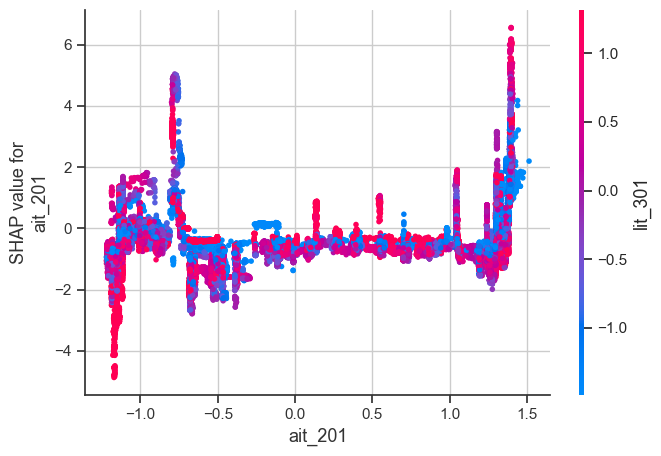

In [53]:
shap.dependence_plot('ait_201', shap_values, features_test_scaled_df)

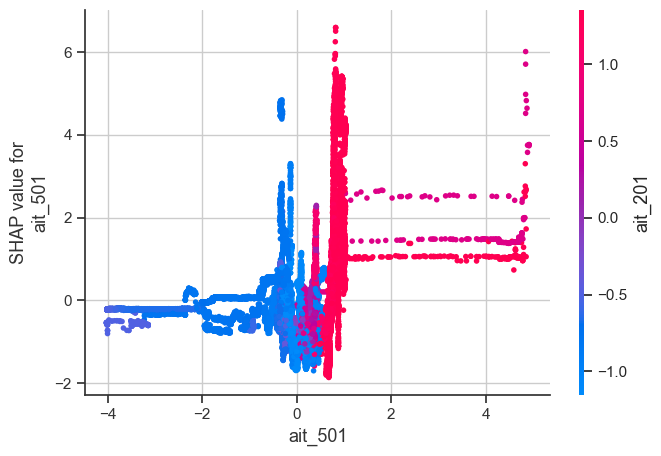

In [54]:
shap.dependence_plot('ait_501', shap_values, features_test_scaled_df)

Аномалии предсказания на тестовом участке датасета варьируются от средних до достаточно уверенных ошибок.

In [55]:
# Получение предсказаний и вероятностей
predictions_lgbmc = lgbmc.predict(features_test_scaled)
features_test_scaled_lgbmc_proba = lgbmc.predict_proba(features_test_scaled)

# Выделение уверенных ошибок
max_proba = np.max(features_test_scaled_lgbmc_proba, axis=1)
errors = pd.DataFrame(features_test_scaled.copy())
errors['true'] = target_test.values
errors['pred'] = predictions_lgbmc
errors['confidence'] = max_proba
errors['is_error'] = (errors['true'] != errors['pred'])
hard_errors = errors[(errors['is_error']) & (errors['confidence'] > 0.8)]
middle_errors = errors[0.5 < (errors['is_error']) & (errors['confidence'] < 0.8)]
soft_errors = errors[(errors['is_error']) & (errors['confidence'] < 0.5)]

In [56]:
print(f'Общее количество ошибок: {errors['is_error'].sum()}')
print(f"Количество серьезных ошибок: {len(hard_errors)}")
print(f"Доля уверенных ошибок: {len(hard_errors)/errors['is_error'].sum():.1%}")
print(f"Количество средних ошибок: {len(middle_errors)}")
print(f"Доля средних ошибок: {len(middle_errors)/errors['is_error'].sum():.1%}")
print(f"Количество небольших ошибок: {len(soft_errors)}")
print(f"Доля небольших ошибок: {len(soft_errors)/errors['is_error'].sum():.1%}")

Общее количество ошибок: 125
Количество серьезных ошибок: 93
Доля уверенных ошибок: 74.4%
Количество средних ошибок: 32
Доля средних ошибок: 25.6%
Количество небольших ошибок: 0
Доля небольших ошибок: 0.0%


Построим временной график сравнения меток для визуализации аномалий предсказания на всем участке датасета:
- применим выбранную модель к всему датасету,
- имеющиеся метки истинных аномалий соотнесемм с предсказанными аномалиями,
- построим временной график сравнения меток.

In [57]:
# для построения графика на всем участке датасета - вернемся к первоначальному датасету и доработаем его для работы модели
display(plot_data_clean.head(10))
# удаление лишних признаков
plot_data_clean = plot_data_clean.drop(columns=['fit_502','fit_503','fit_504','p_501','pit_501','pit_503','fit_401','lit_401',
                                                'p_402','ait_402','uv_401','ait_502','p_302','dpit_301','mv_101','p_101','fit_201','mv_201','p_203',
                                                'p_205','p_204','mv_302'], axis=1)
display(plot_data_clean.head(10))
# разделим датасет на целевой блок и на прочие признаки, временной индекс сохраняем
target_plot_data_clean = plot_data_clean['state']
features_plot_data_clean = plot_data_clean.drop('state', axis=1)
display(target_plot_data_clean.info())
display(features_plot_data_clean.info())
# стандартизация признаков, используем ранее созданный scaler
features_plot_data_clean_scaled = scaler.fit_transform(features_plot_data_clean)
display(features_plot_data_clean_scaled.shape)

,fit_101,lit_101,mv_101,p_101,p_102,ait_201,ait_202,ait_203,fit_201,mv_201,p_201,p_203,p_204,p_205,p_206,dpit_301,fit_301,lit_301,mv_301,mv_302,mv_303,mv_304,p_302,ait_401,ait_402,fit_401,lit_401,p_402,p_403,uv_401,ait_501,ait_502,ait_503,ait_504,fit_501,fit_502,fit_503,fit_504,p_501,pit_501,pit_502,pit_503,fit_601,p_602,state
time_stamp,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2015-12-28 10:00:00,2.427057,522.8467,2,2,1,262.0161,8.396437,328.6337,2.445391,2,1,2,1,2,1,19.74838,2.206835,956.1651,1,2,1,1,2,148.808,156.0882,1.713517,942.0662,2,1,2,7.878621,145.1166,264.5475,12.03538,1.723789,1.279621,0.735269,0.307786,2,250.8652,1.649953,189.5988,0.000128,1,0
2015-12-28 10:00:01,2.446274,522.8860,2,2,1,262.0161,8.396437,328.6337,2.445391,2,1,2,1,2,1,19.74838,2.208244,956.1651,1,2,1,1,2,148.808,156.0882,1.715952,942.0277,2,1,2,7.878621,145.1166,264.5475,12.03538,1.723789,1.297554,0.735269,0.307786,2,250.8652,1.649953,189.6789,0.000128,1,0
2015-12-28 10:00:02,2.489191,522.8467,2,2,1,262.0161,8.394514,328.6337,2.442316,2,1,2,1,2,1,19.69076,2.208628,956.4855,1,2,1,1,2,148.808,156.0882,1.715952,941.8739,2,1,2,7.878621,145.1166,264.5475,12.03538,1.723404,1.293967,0.735269,0.308619,2,250.8812,1.649953,189.6789,0.000128,1,0
2015-12-28 10:00:03,2.534350,522.9645,2,2,1,262.0161,8.394514,328.6337,2.442316,2,1,2,1,2,1,19.69076,2.208628,956.8060,1,2,1,1,2,148.808,156.0882,1.714670,941.7970,2,1,2,7.878621,145.0141,264.5475,12.03538,1.723404,1.281158,0.735269,0.308619,2,250.8812,1.649953,189.6148,0.000128,1,0
2015-12-28 10:00:04,2.569260,523.4748,2,2,1,262.0161,8.394514,328.6337,2.443085,2,1,2,1,2,1,19.69076,2.208628,957.0864,1,2,1,1,2,148.808,156.0882,1.714670,942.2200,2,1,2,7.878621,144.8859,264.5475,12.03538,1.723404,1.281158,0.735269,0.308619,2,250.8812,1.649953,189.5027,0.000128,1,0
2015-12-28 10:00:05,2.609294,523.8673,2,2,1,262.0161,8.394514,328.6337,2.444110,2,1,2,1,2,1,19.69076,2.207347,957.1664,1,2,1,1,2,148.808,155.9600,1.714670,942.6429,2,1,2,7.878621,144.8859,264.5475,12.03538,1.723404,1.272704,0.735269,0.308619,2,250.7530,1.649953,189.5027,0.000128,1,0
2015-12-28 10:00:06,2.637158,524.1028,2,2,1,262.0161,8.394514,328.6337,2.444110,2,1,2,1,2,1,19.69076,2.210037,957.0062,1,2,1,1,2,148.808,155.9600,1.713004,942.7582,2,1,2,7.878621,144.8859,264.5475,12.03538,1.723404,1.270142,0.735269,0.308619,2,250.5928,1.649953,189.5027,0.000128,1,0
2015-12-28 10:00:07,2.652211,524.2206,2,2,1,262.0161,8.394514,328.6337,2.441803,2,1,2,1,2,1,19.69076,2.210037,957.2866,1,2,1,1,2,148.808,155.9600,1.713004,943.1043,2,1,2,7.878621,144.8859,264.5475,12.03538,1.723404,1.262329,0.735269,0.308619,2,250.5928,1.649953,189.5027,0.000128,1,0
2015-12-28 10:00:08,2.655735,524.4954,2,2,1,262.0161,8.394514,328.6337,2.441803,2,1,2,1,2,1,19.66195,2.210037,957.6071,1,2,1,1,2,148.808,155.9600,1.712620,943.3735,2,1,2,7.878621,144.8859,264.5475,12.03538,1.723404,1.270398,0.735269,0.308619,2,250.9132,1.649953,189.5027,0.000128,1,0


,fit_101,lit_101,p_102,ait_201,ait_202,ait_203,p_201,p_206,fit_301,lit_301,mv_301,mv_303,mv_304,ait_401,p_403,ait_501,ait_503,ait_504,fit_501,pit_502,fit_601,p_602,state
time_stamp,,,,,,,,,,,,,,,,,,,,,,,
2015-12-28 10:00:00,2.427057,522.8467,1,262.0161,8.396437,328.6337,1,1,2.206835,956.1651,1,1,1,148.808,1,7.878621,264.5475,12.03538,1.723789,1.649953,0.000128,1,0
2015-12-28 10:00:01,2.446274,522.8860,1,262.0161,8.396437,328.6337,1,1,2.208244,956.1651,1,1,1,148.808,1,7.878621,264.5475,12.03538,1.723789,1.649953,0.000128,1,0
2015-12-28 10:00:02,2.489191,522.8467,1,262.0161,8.394514,328.6337,1,1,2.208628,956.4855,1,1,1,148.808,1,7.878621,264.5475,12.03538,1.723404,1.649953,0.000128,1,0
2015-12-28 10:00:03,2.534350,522.9645,1,262.0161,8.394514,328.6337,1,1,2.208628,956.8060,1,1,1,148.808,1,7.878621,264.5475,12.03538,1.723404,1.649953,0.000128,1,0
2015-12-28 10:00:04,2.569260,523.4748,1,262.0161,8.394514,328.6337,1,1,2.208628,957.0864,1,1,1,148.808,1,7.878621,264.5475,12.03538,1.723404,1.649953,0.000128,1,0
2015-12-28 10:00:05,2.609294,523.8673,1,262.0161,8.394514,328.6337,1,1,2.207347,957.1664,1,1,1,148.808,1,7.878621,264.5475,12.03538,1.723404,1.649953,0.000128,1,0
2015-12-28 10:00:06,2.637158,524.1028,1,262.0161,8.394514,328.6337,1,1,2.210037,957.0062,1,1,1,148.808,1,7.878621,264.5475,12.03538,1.723404,1.649953,0.000128,1,0
2015-12-28 10:00:07,2.652211,524.2206,1,262.0161,8.394514,328.6337,1,1,2.210037,957.2866,1,1,1,148.808,1,7.878621,264.5475,12.03538,1.723404,1.649953,0.000128,1,0
2015-12-28 10:00:08,2.655735,524.4954,1,262.0161,8.394514,328.6337,1,1,2.210037,957.6071,1,1,1,148.808,1,7.878621,264.5475,12.03538,1.723404,1.649953,0.000128,1,0


<class 'pandas.core.series.Series'>
DatetimeIndex: 449919 entries, 2015-12-28 10:00:00 to 2016-02-01 14:59:59
Series name: state
Non-Null Count   Dtype
--------------   -----
449919 non-null  int64
dtypes: int64(1)
memory usage: 23.0 MB


None

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 449919 entries, 2015-12-28 10:00:00 to 2016-02-01 14:59:59
Data columns (total 22 columns):
 #   Column   Non-Null Count   Dtype  
---  ------   --------------   -----  
 0   fit_101  449919 non-null  float64
 1   lit_101  449919 non-null  float64
 2   p_102    449919 non-null  int64  
 3   ait_201  449919 non-null  float64
 4   ait_202  449919 non-null  float64
 5   ait_203  449919 non-null  float64
 6   p_201    449919 non-null  int64  
 7   p_206    449919 non-null  int64  
 8   fit_301  449919 non-null  float64
 9   lit_301  449919 non-null  float64
 10  mv_301   449919 non-null  int64  
 11  mv_303   449919 non-null  int64  
 12  mv_304   449919 non-null  int64  
 13  ait_401  449919 non-null  float64
 14  p_403    449919 non-null  int64  
 15  ait_501  449919 non-null  float64
 16  ait_503  449919 non-null  float64
 17  ait_504  449919 non-null  float64
 18  fit_501  449919 non-null  float64
 19  pit_502  449919 non-null  float

None

(449919, 22)

In [58]:
%%time
# получим метрики для модели LGBMClassifier
predictions_all_dataset = lgbmc.predict(features_plot_data_clean_scaled)

lgbmc_accuracy_score_all_dataset = accuracy_score(target_plot_data_clean, predictions_all_dataset)
print('Средняя точность(accuracy):', accuracy_score(target_plot_data_clean, predictions_all_dataset))

lgbmc_precision_score_all_dataset = precision_score(target_plot_data_clean, predictions_all_dataset)
print('Доля предсказанных положительных случаев(precision):', precision_score(target_plot_data_clean, predictions_all_dataset))

lgbmc_recall_score_all_dataset = recall_score(target_plot_data_clean, predictions_all_dataset)
print('Полнота(recall):', recall_score(target_plot_data_clean, predictions_all_dataset))

lgbmc_f1_score_all_dataset = f1_score(target_plot_data_clean, predictions_all_dataset)
print('Точность и полнота(F1):', f1_score(target_plot_data_clean, predictions_all_dataset))

lgbmc_roc_auc_score_all_dataset = roc_auc_score(target_plot_data_clean, predictions_all_dataset)
print('Качество бинарной классификации(roc_auc):', roc_auc_score(target_plot_data_clean, predictions_all_dataset))

print(classification_report(target_plot_data_clean, predictions_all_dataset))

Средняя точность(accuracy): 0.956867791758072
Доля предсказанных положительных случаев(precision): 0.8319101208316839
Полнота(recall): 0.8079676314970433
Точность и полнота(F1): 0.8197640939908981
Качество бинарной классификации(roc_auc): 0.8927049830703901
              precision    recall  f1-score   support

           0       0.97      0.98      0.98    395298
           1       0.83      0.81      0.82     54621

    accuracy                           0.96    449919
   macro avg       0.90      0.89      0.90    449919
weighted avg       0.96      0.96      0.96    449919

CPU times: total: 4.3 s
Wall time: 1.8 s


Можно сделать предварительный вывод, что на всем датасете качество работы модели снижается по показателям:
1. Средняя точность(accuracy) - снижение на 4,2%,
2. Доля предсказанных положительных случаев(precision) - снижение на 16%,
3. Полнота(recall) - снижение на 19,2%,
4. Точность и полнота(F1) - снижение на 17,6%,
5. Качество бинарной классификации(roc_auc) - снижение на 10

In [59]:
# сформируем датафрейм из данных из сгенерированных предсказаний
predictions_all_dataset_df = pd.DataFrame(predictions_all_dataset, columns=['predicted_state'])
display(predictions_all_dataset_df.info())
display(plot_data_clean.info())
# добавим к датафрейму индекс-временной ряд из первоначальной выборки
plot_data_clean_new = plot_data_clean.copy()
plot_data_clean_new['predicted_state'] = predictions_all_dataset_df['predicted_state'].values
plot_data_clean_new = plot_data_clean_new[['state', 'predicted_state']]
display(plot_data_clean_new.head(10))
display(plot_data_clean_new.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 449919 entries, 0 to 449918
Data columns (total 1 columns):
 #   Column           Non-Null Count   Dtype
---  ------           --------------   -----
 0   predicted_state  449919 non-null  int64
dtypes: int64(1)
memory usage: 3.4 MB


None

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 449919 entries, 2015-12-28 10:00:00 to 2016-02-01 14:59:59
Data columns (total 23 columns):
 #   Column   Non-Null Count   Dtype  
---  ------   --------------   -----  
 0   fit_101  449919 non-null  float64
 1   lit_101  449919 non-null  float64
 2   p_102    449919 non-null  int64  
 3   ait_201  449919 non-null  float64
 4   ait_202  449919 non-null  float64
 5   ait_203  449919 non-null  float64
 6   p_201    449919 non-null  int64  
 7   p_206    449919 non-null  int64  
 8   fit_301  449919 non-null  float64
 9   lit_301  449919 non-null  float64
 10  mv_301   449919 non-null  int64  
 11  mv_303   449919 non-null  int64  
 12  mv_304   449919 non-null  int64  
 13  ait_401  449919 non-null  float64
 14  p_403    449919 non-null  int64  
 15  ait_501  449919 non-null  float64
 16  ait_503  449919 non-null  float64
 17  ait_504  449919 non-null  float64
 18  fit_501  449919 non-null  float64
 19  pit_502  449919 non-null  float

None

,state,predicted_state
time_stamp,,
2015-12-28 10:00:00,0,0
2015-12-28 10:00:01,0,0
2015-12-28 10:00:02,0,0
2015-12-28 10:00:03,0,0
2015-12-28 10:00:04,0,0
2015-12-28 10:00:05,0,0
2015-12-28 10:00:06,0,0
2015-12-28 10:00:07,0,0
2015-12-28 10:00:08,0,0


<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 449919 entries, 2015-12-28 10:00:00 to 2016-02-01 14:59:59
Data columns (total 2 columns):
 #   Column           Non-Null Count   Dtype
---  ------           --------------   -----
 0   state            449919 non-null  int64
 1   predicted_state  449919 non-null  int64
dtypes: int64(2)
memory usage: 26.4 MB


None

Для более наглядного представления аномалий на всем участке датасета разобьем датасет на 3 части и построим для этих частей отдельные графики:
- длительность периода с атаками в начале датасета - 5 дней(28.12.2015г.- 01.01.2016г.),
- длительность периода без атак в середине датасета - 30 дней(02.01.2016г.- 31.01.2016г.), данный период рекомендуется исключить в связи с отсутствием активности,
- длительность периода с атаками в конце датасета - 1 день(01.02.2016г.).

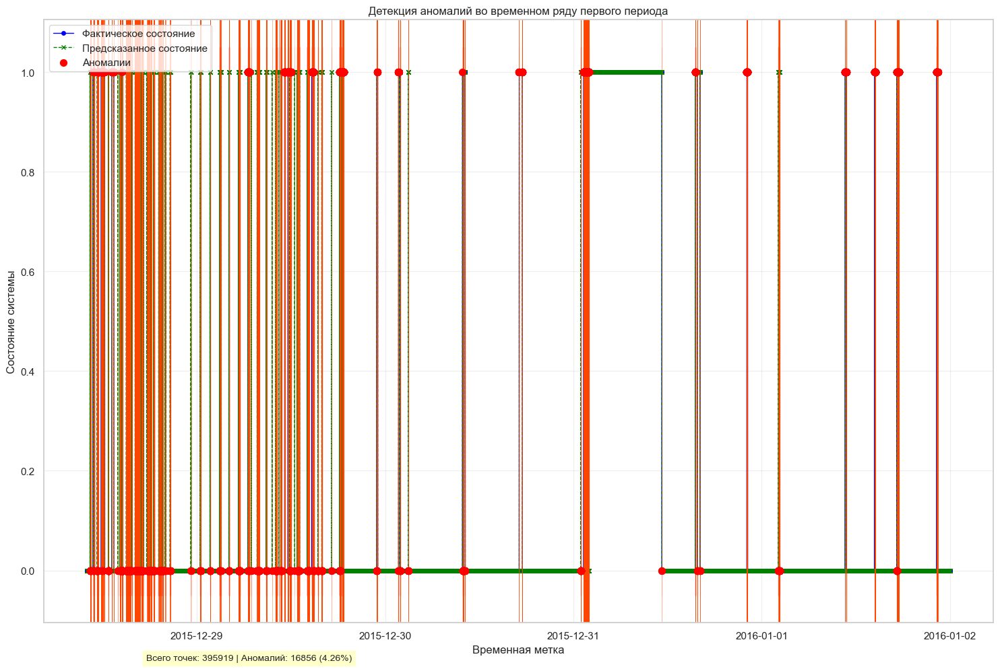

In [60]:
# построим график аномалий предсказания в начале датасета - 5 дней(28.12.2015г.- 01.01.2016г.)
plot_data_clean_new_first_part = plot_data_clean_new.loc[:'2016-01-01 23:59:59']
plot_data_clean_new_first_part['anomaly'] = plot_data_clean_new_first_part['state'] != plot_data_clean_new_first_part['predicted_state']
plt.figure(figsize=(15,10))
plt.plot(plot_data_clean_new_first_part.index, plot_data_clean_new_first_part['state'],
         label = 'Фактическое состояние',
         color = 'blue',
         marker = 'o',
         markersize = 4,
         linewidth = 1)
plt.plot(plot_data_clean_new_first_part.index, plot_data_clean_new_first_part['predicted_state'],
         label = 'Предсказанное состояние',
         color = 'green',
         linestyle = '--',
         marker = 'x',
         markersize = 4,
         linewidth = 1)
anomalies_first_part = plot_data_clean_new_first_part[plot_data_clean_new_first_part['anomaly']]
plt.scatter(anomalies_first_part.index, anomalies_first_part['state'],
         label = 'Аномалии',
         color = 'red',
         s = 50,
         zorder = 5)
for idx in anomalies_first_part.index:
    plt.axvline(x=idx, color='orangered', alpha=0.3, linewidth=0.5)
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.gca().xaxis.set_major_locator(mdates.AutoDateLocator())
plt.legend(loc='upper left')
plt.title('Детекция аномалий во временном ряду первого периода')
plt.xlabel('Временная метка')
plt.ylabel('Состояние системы')
plt.grid(alpha=0.3)
total_points_first_part = len(plot_data_clean_new_first_part)
anomaly_points_first_part = len(anomalies_first_part)
plt.figtext(0.15, 0.01, 
            f"Всего точек: {total_points_first_part} | Аномалий: {anomaly_points_first_part} ({anomaly_points_first_part/total_points_first_part:.2%})",
            fontsize=10,
            bbox=dict(facecolor='yellow', alpha=0.2))
plt.tight_layout()
ymin, ymax = plt.ylim()
plt.fill_between(plot_data_clean_new_first_part.index, ymin, ymax, 
                 where=plot_data_clean_new_first_part['anomaly'], 
                 color='red', alpha=0.1,
                 label='Области аномалий')
plt.gcf().autofmt_xdate
plt.gcf().canvas.toolbar_visible = True
plt.tight_layout()
plt.show()

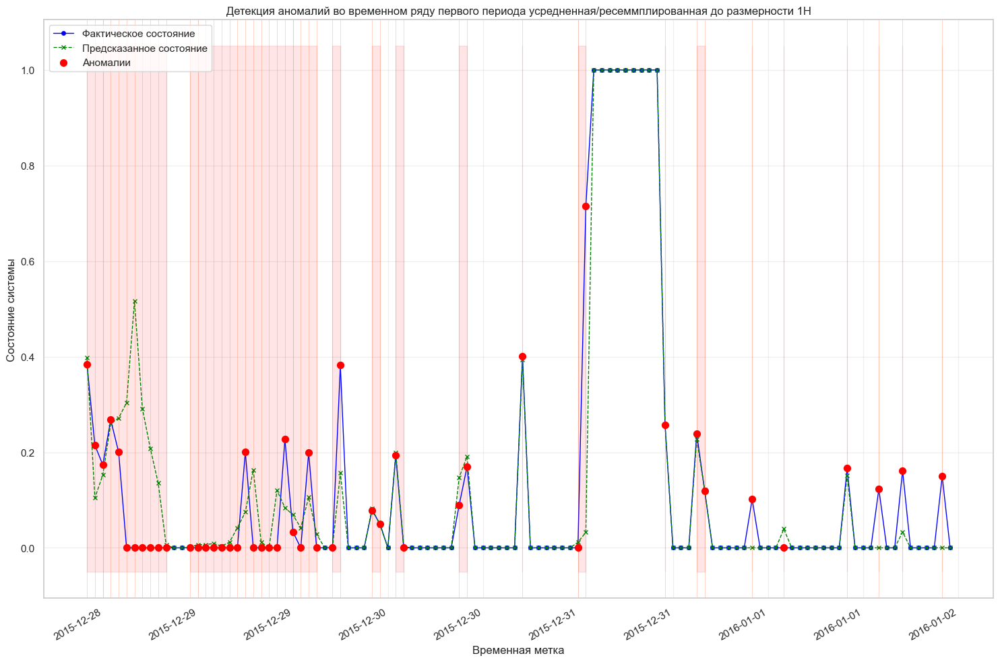

In [61]:
# построим график аномалий предсказания в начале датасета - 5 дней(28.12.2015г.- 01.01.2016г.)
plot_data_clean_new_first_part = plot_data_clean_new.loc[:'2016-01-01 23:59:59']
if len(plot_data_clean_new_first_part) > 10000:
    plot_data_clean_new_first_part = plot_data_clean_new_first_part.resample('1H').mean()
plot_data_clean_new_first_part['anomaly'] = plot_data_clean_new_first_part['state'] != plot_data_clean_new_first_part['predicted_state']
plt.figure(figsize=(15,10))
plt.plot(plot_data_clean_new_first_part.index, plot_data_clean_new_first_part['state'],
         label = 'Фактическое состояние',
         color = 'blue',
         marker = 'o',
         markersize = 4,
         linewidth = 1)
plt.plot(plot_data_clean_new_first_part.index, plot_data_clean_new_first_part['predicted_state'],
         label = 'Предсказанное состояние',
         color = 'green',
         linestyle = '--',
         marker = 'x',
         markersize = 4,
         linewidth = 1)
anomalies_first_part = plot_data_clean_new_first_part[plot_data_clean_new_first_part['anomaly']]
plt.scatter(anomalies_first_part.index, anomalies_first_part['state'],
         label = 'Аномалии',
         color = 'red',
         s = 50,
         zorder = 5)
for idx in anomalies_first_part.index:
    plt.axvline(x=idx, color='orangered', alpha=0.3, linewidth=0.5)
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.gca().xaxis.set_major_locator(mdates.AutoDateLocator())
plt.gcf().autofmt_xdate()
plt.legend(loc='upper left')
plt.title('Детекция аномалий во временном ряду первого периода усредненная/ресеммплированная до размерности 1H')
plt.xlabel('Временная метка')
plt.ylabel('Состояние системы')
plt.grid(alpha=0.3)
total_points_first_part = len(plot_data_clean_new_first_part)
anomaly_points_first_part = len(anomalies_first_part)
plt.tight_layout()
ymin, ymax = plt.ylim()
plt.fill_between(plot_data_clean_new_first_part.index, ymin, ymax, 
                 where=plot_data_clean_new_first_part['anomaly'], 
                 color='red', alpha=0.1,
                 label='Области аномалий')
plt.show()

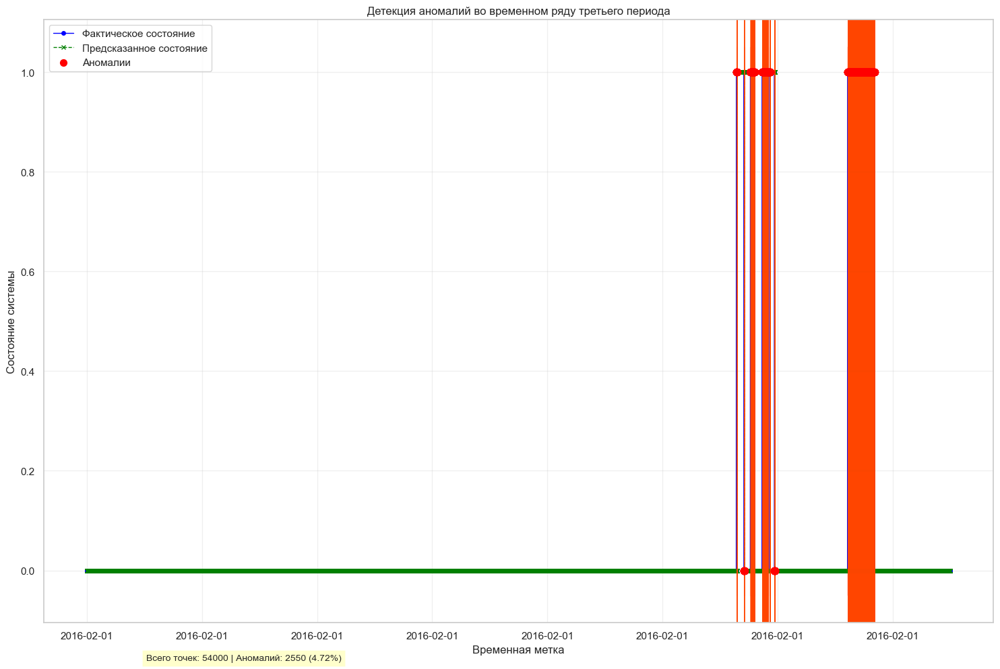

In [62]:
# построим график аномалий предсказания в конце датасета - 1 день(01.02.2016г.)
# добавляем столбец аномалии
plot_data_clean_new_third_part = plot_data_clean_new.loc['2016-02-01 00:00:00':]
plot_data_clean_new_third_part['anomaly'] = plot_data_clean_new_third_part['state'] != plot_data_clean_new_third_part['predicted_state']
plt.figure(figsize=(15,10))
plt.plot(plot_data_clean_new_third_part.index, plot_data_clean_new_third_part['state'],
         label = 'Фактическое состояние',
         color = 'blue',
         marker = 'o',
         markersize = 4,
         linewidth = 1)
plt.plot(plot_data_clean_new_third_part.index, plot_data_clean_new_third_part['predicted_state'],
         label = 'Предсказанное состояние',
         color = 'green',
         linestyle = '--',
         marker = 'x',
         markersize = 4,
         linewidth = 1)
anomalies_third_part = plot_data_clean_new_third_part[plot_data_clean_new_third_part['anomaly']]
plt.scatter(anomalies_third_part.index, anomalies_third_part['state'],
         label = 'Аномалии',
         color = 'red',
         s = 50,
         zorder = 5)
for idx in anomalies_third_part.index:
    plt.axvline(x=idx, color='orangered', alpha=0.3, linewidth=0.5)
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.gca().xaxis.set_major_locator(mdates.AutoDateLocator())
plt.legend(loc='upper left')
plt.title('Детекция аномалий во временном ряду третьего периода')
plt.xlabel('Временная метка')
plt.ylabel('Состояние системы')
plt.grid(alpha=0.3)
total_points_third_part = len(plot_data_clean_new_third_part)
anomaly_points_third_part = len(anomalies_third_part)
plt.figtext(0.15, 0.01, 
            f"Всего точек: {total_points_third_part} | Аномалий: {anomaly_points_third_part} ({anomaly_points_third_part/total_points_third_part:.2%})",
            fontsize=10,
            bbox=dict(facecolor='yellow', alpha=0.2))
plt.tight_layout()
ymin, ymax = plt.ylim()
plt.fill_between(plot_data_clean_new_third_part.index, ymin, ymax, 
                 where=plot_data_clean_new_third_part['anomaly'], 
                 color='red', alpha=0.1,
                 label='Области аномалий')
plt.gcf().autofmt_xdate
plt.gcf().canvas.toolbar_visible = True
plt.tight_layout()
plt.show()

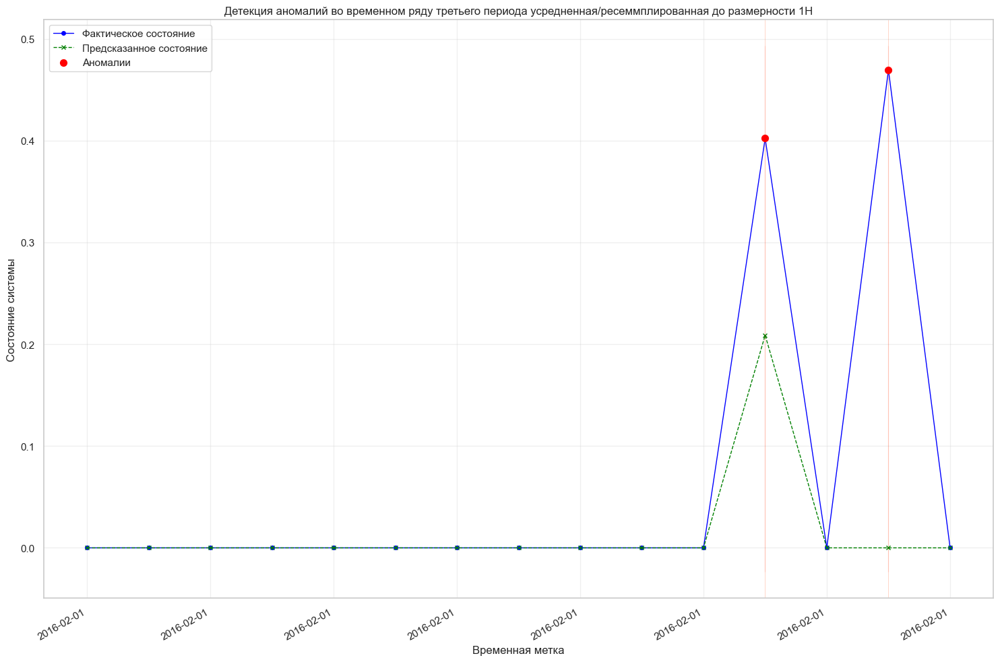

In [63]:
# построим график аномалий предсказания в конце датасета - 1 день(01.02.2016г.)
# добавляем столбец аномалии
plot_data_clean_new_third_part = plot_data_clean_new.loc['2016-02-01 00:00:00':]
if len(plot_data_clean_new_third_part) > 10000:
    plot_data_clean_new_third_part = plot_data_clean_new_third_part.resample('1H').mean()
plot_data_clean_new_third_part['anomaly'] = plot_data_clean_new_third_part['state'] != plot_data_clean_new_third_part['predicted_state']
plt.figure(figsize=(15,10))
plt.plot(plot_data_clean_new_third_part.index, plot_data_clean_new_third_part['state'],
         label = 'Фактическое состояние',
         color = 'blue',
         marker = 'o',
         markersize = 4,
         linewidth = 1)
plt.plot(plot_data_clean_new_third_part.index, plot_data_clean_new_third_part['predicted_state'],
         label = 'Предсказанное состояние',
         color = 'green',
         linestyle = '--',
         marker = 'x',
         markersize = 4,
         linewidth = 1)
anomalies_third_part = plot_data_clean_new_third_part[plot_data_clean_new_third_part['anomaly']]
plt.scatter(anomalies_third_part.index, anomalies_third_part['state'],
         label = 'Аномалии',
         color = 'red',
         s = 50,
         zorder = 5)
for idx in anomalies_third_part.index:
    plt.axvline(x=idx, color='orangered', alpha=0.3, linewidth=0.5)
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.gca().xaxis.set_major_locator(mdates.AutoDateLocator())
plt.gcf().autofmt_xdate()
plt.legend(loc='upper left')
plt.title('Детекция аномалий во временном ряду третьего периода усредненная/ресеммплированная до размерности 1H')
plt.xlabel('Временная метка')
plt.ylabel('Состояние системы')
plt.grid(alpha=0.3)
total_points_third_part = len(plot_data_clean_new_third_part)
anomaly_points_third_part = len(anomalies_third_part)
plt.tight_layout()
ymin, ymax = plt.ylim()
plt.fill_between(plot_data_clean_new_third_part.index, ymin, ymax, 
                 where=plot_data_clean_new_third_part['anomaly'], 
                 color='red', alpha=0.1,
                 label='Области аномалий')
plt.show()

### Вывод

В результате визуального анализа значимости признаков инструментом SHAP были выявлены 5 наиболее значимых признаков(fit_501, pit_502, lit_301, ait_201,
ait_501), их возможные сочетания при взаимном влиянии друг на друга, что тредует проведения дополнительного исследования на более широком горизонте ретроспективно для формирования более четких индикаторов реакции системы на атаки. Также для подтверждения корректности выводов возможно в качестве отдельного исследования может, например, потребоваться провести анализ главных компонент для выявления/подтверждения взаимосвязей между признаками.

Также были построены графики по блокам датасета 1 и 3(2 времненой период был исключен ввиду отсутствия активности), по данным этих графиков визуально можно увидеть ряд аномалий и определить их долю как:
- на участке датасета 5 дней(28.12.2015г.- 01.01.2016г.) - доля аномалий составляет 4,26%,
- на участке 1 день(01.02.2016г.) доля аномалий составляет 4,72%.


## 7. Итоговый отчет по решению

**В рамках итогового отчета по прикладному проекту систематизированы и даны ответы на следующие вопросы:**
1. Обзор предметной области, проблематики и постановка общей задачи для DS;
2. Анализ данных и выбор метрики для оценки моделей;
3. Построение моделей предсказания состояния(1/0) и экспертная оценка характеристик.

**План работы указан выше, все пункты плана были реализованы в рамках данной работы, а именно:**

**1.** Сформулированы основные требования по проекту заказчиком: обзор проблематики, выбор метрик, создание модели(акцент был сделан на RandomForestClassifier),

**2.** Произведен обзор предметной области по имеющимся данным(машинные переводы статей-исследователей западных университетов), на направленный запрос по выборке и предметной области в курирующий университет - ответ до сих пор не получен, поэтому была получена экспериментальная выгрузка данных от заказчика, которая также соответствовала данным информации из kaggle(ссылка указана выше);

**3.** Проанализирована предметная область и проведена предобработка данных:
   - загружены данные по этапам: P1: забор сырой воды, P2: обеззараживание химикатами, P3: ультрафильтрация, P4: дехлорирование с помощью ультрафиолетовых ламп, P5: очистка методом обратного осмоса, P6: обратная промывка и очистка мембраны ультрафильтрации, а также по вспомогательным этапам;
   - произведен анализ признаков, категорий целевого признака,
   - скорректировано представление данных для дальнейшего анализа;
   - проверены данные последовательности временного ряда.

**4.** Проведен анализ признаков и корреляций:
   - доля инцидентов в выборке составляет 12.1%, доля периодов с отсутствием инцидентов 87.9%, присуствтует дисбаланс классов, необходимо снижение дисбаланса классов путем Undersampling с перемешиванием данных выборки;
   - выделены признаки для удаления, которые имеют корреляцию между собой более +/-0,85(экспертно): fit_502, fit_503, fit_504, p_501, pit_501, pit_503, fit_401, lit_401, p_402, ait_402, uv_401, ait_502, p_302, dpit_301, mv_101, p_101, fit_201, mv_201, p_203, p_205, p_204, mv_302.

**5.** Стандартизированы признаки, устранены дисбалансы и сформированые критерии оценки моделей:
   - ключевым признаком был выбран признак полноты(recall) - доля предсказанных положительных случаев(TP / (TP + FN))(это наиболее важная метрика в задачах обнаружения атак и наша задача - обнаружить как можно больше атак(минимизировать FN)), поэтому в качестве основной метрики для моделей выберем данную метрику;
   - определены модели: DecisionTreeClassifier - бинарное дерево; LogisticRegression - линейный классификатор, позволяющий оценивать вероятности принадлежности объектов классам; RandomForestClassifier - объединяет несколько деревьев решений для улучшения точности и устойчивости модели; LGBMClassifier - реализация деревьев принятия решений с градиентным бустингом; DummyClassifier - простейшая модель-эталон для определения адекватности результатов других моделей.

**6.**  Проведена работа с моделями(подборка параметров, проверка на кроссвалидации и тесте), оценка результатов;

**7.**  Проведен анализ моделей: 
    
    - сравнение характеристик моделей по точности результата(метрика полноты(recall)) - выбрана модель LGBMClassifier с результатом 0,999740 как по основной метрике, так и по совокупности метрик;
    - анализ значимости факторов модели - победителя: при помощи инструмента SHAP выделен топ-5 признаков, оказавших наибольшее влияние на показатели модели: fit_501, pit_502, lit_301, ait_201, ait_501. Оценено взаимодействие этих признаков и определены точки для возможных исследований.

**8.**  Проведен анализ аномалий на всем участке датасета: 

1. На всем датасете качество работы модели снижается по показателям:
    - средняя точность(accuracy) - снижение на 4,2%,
    - доля предсказанных положительных случаев(precision) - снижение на 16%,
    - полнота(recall) - снижение на 19,2%,
    - точность и полнота(F1) - снижение на 17,6%,
    - качество бинарной классификации(roc_auc) - снижение на 10

Также были построены графики по блокам датасета 1 и 3(2 времненой период был исключен ввиду отсутствия активности), по данным этих графиков визуально можно увидеть ряд аномалий, что связано со снижением точности и можно определить их долю как:
- на участке датасета 5 дней(28.12.2015г.- 01.01.2016г.) - доля аномалий составляет 4,26%,
- на участке 1 день(01.02.2016г.) доля аномалий составляет 4,72%.

Таким образом на реальных данных выявляется слабость модели, т.к. ключевые метрики снижаются и можно предполагать, что наличие серьезных ошибок и ложных срабатывайний являются индикатором проблемы использования простых моделей классификации. Возможно, использование ансамблирования для повышения предсказательной точности, также не исключены ошибки во входящих данных, например, шум, разметка данных и пр.










